In [1]:
import joblib
import pandas as pd
import json
import numpy as np
import umap
import matplotlib.pyplot as plt


In [2]:
data_with_pred_path = 'data_with_pred.joblib'
data_with_pred = joblib.load(data_with_pred_path)
index_info = json.load(open('index_info.json', 'r'))
# load the data with predictions
model_list = np.array(["CAT","CNN","GBM","LR","MLP","RF","SVR","TRANS","XGB","Diffusion"])
data_with_pred["ECNumber"]

0          4.2.3.4
1          4.2.3.4
2          4.2.3.4
3        2.1.1.255
4        2.1.1.255
           ...    
17005     1.1.1.82
17006     1.1.1.82
17007     1.1.1.82
17008     1.1.1.82
17009     1.1.1.82
Name: ECNumber, Length: 17010, dtype: object

In [3]:
data_with_pred["protein_id"]=[int(i.split(".")[0]) for i in data_with_pred["ECNumber"]]
data_with_pred["protein_id"]
PROTEIN_TYPES_NAMES=np.array([None,"Oxidoreductases","Transferases","Hydrolases","Lyases","Isomerases","Ligases","Translocases"])

data_with_pred["protein_label"]=data_with_pred["protein_id"].astype(str)+"_"+PROTEIN_TYPES_NAMES[data_with_pred["protein_id"]]
data_with_pred[["protein_id","protein_label"]]
data_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,...,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",...,0.663200,0.699803,0.789498,0.645794,0.609699,1.518631,0.101571,1.163954,4,4_Lyases
1,4.2.3.4,Aspergillus nidulans,C(C(C(C(COP(=O)([O-])[O-])O)O)O)C(=O)C(=O)[O-],3-deoxy-D-arabino-heptulosonate 7-phosphate,MSNPTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTN...,6.8000,s^(-1),0.832509,"[0.4610253, 0.039623156, -0.4662559, 0.4188257...","[-0.10084063, -0.099633686, -0.011382125, 0.10...",...,0.214131,0.334828,-0.054305,0.233004,0.232668,-0.144095,0.059912,0.083769,4,4_Lyases
2,4.2.3.4,Neurospora crassa,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAEPISNPTRINILGKDNIIIDHGIWLNFVAQDLLQNIKSSTYILI...,19.0000,s^(-1),1.278754,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12705962, -0.09898393, 0.0041820942, 0.096...",...,0.599826,1.206366,-0.199238,0.044649,0.511439,-0.080288,0.462060,0.072347,4,4_Lyases
3,2.1.1.255,Streptomyces coelicolor,C[S+](CCC(C(=O)[O-])N)CC1C(C(C(O1)N2C=NC3=C(N=...,S-Adenosyl-L-methionine,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0075,s^(-1),-2.124939,"[0.52348095, -0.18665986, -0.39555183, 0.11716...","[0.0015065962, -0.087554656, -0.014490904, -0....",...,-1.175319,-1.474060,0.029394,-0.541222,-1.155302,-0.065997,-0.245066,-0.541999,2,2_Transferases
4,2.1.1.255,Streptomyces coelicolor,CC(=CCCC(=C(C)COP(=O)(O)OP(=O)(O)O)C)C,(E)-2-Methylgeranyl diphosphate,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0390,s^(-1),-1.408935,"[0.17630623, -0.4595529, -0.6368343, -0.136045...","[0.0015065962, -0.087554656, -0.014490904, -0....",...,-1.144530,-0.547729,-0.058778,-0.249726,-0.724405,-0.007775,-0.379744,-0.108247,2,2_Transferases
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17005,1.1.1.82,Zea mays,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADPH,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,955.0000,s^(-1),2.980003,"[0.36284313, -0.21340896, -0.8913718, -0.23485...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",...,1.727886,1.525536,0.081383,0.789890,1.662899,-0.182908,1.397632,0.411608,1,1_Oxidoreductases
17006,1.1.1.82,Zea mays,C(C(C(=O)O)O)C(=O)O,L-Malate,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,2.9000,s^(-1),0.462398,"[0.045168612, -0.31311044, -0.21087039, -0.292...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",...,-0.673514,-0.825688,0.146570,-0.507193,-0.558171,0.096716,-1.038001,-0.036032,1,1_Oxidoreductases
17007,1.1.1.82,Zea mays,C1=CC(=C[N+](=C1)C2C(C(C(O2)COP(=O)(O)OP(=O)(O...,NADP+,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,2.9000,s^(-1),0.462398,"[0.18913552, -0.06542938, -0.8761325, 0.133454...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",...,-0.665122,-0.897099,-0.083856,-0.600325,-0.616816,0.204808,-0.781207,-0.356434,1,1_Oxidoreductases
17008,1.1.1.82,Spinacia oleracea,C(C(C(=O)O)O)C(=O)O,L-Malate,MAVAELSPCYQTQIVKPPHLSWLSNNHKLNLLGLPKASRITEICCS...,6.7000,s^(-1),0.826075,"[0.045168612, -0.31311044, -0.21087039, -0.292...","[0.029217303, -0.08372673, 0.0883128, 0.147737...",...,-0.426048,-0.410620,0.109990,-0.064715,-0.196599,0.111337,-0.287688,-0.246301,1,1_Oxidoreductases


In [4]:
test_with_pred= data_with_pred.copy().loc[index_info['test_index'],:]
train_with_pred= data_with_pred.copy().loc[index_info['train_index'],:]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,...,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",...,0.663200,0.699803,0.789498,0.645794,0.609699,1.518631,0.101571,1.163954,4,4_Lyases
20,1.1.1.22,Homo sapiens,C1=CN(C(=O)NC1=O)C2C(C(C(O2)COP(=O)(O)OP(=O)(O...,UDP-D-galactose,MFEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWN...,0.0200,s^(-1),-1.698970,"[0.20797633, -0.65783435, -0.9539016, 0.431711...","[-0.010068754, -0.13892373, 0.018177293, 0.096...",...,-2.506118,-2.499141,-3.516778,-3.401104,-2.290716,-3.529046,-2.981779,-3.246027,1,1_Oxidoreductases
21,1.1.1.22,Homo sapiens,C1=CC(=C[N+](=C1)C2C(C(C(O2)COP(=O)([O-])OP(=O...,NAD+,MFEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWN...,0.0550,s^(-1),-1.259637,"[0.3175878, 0.010024521, -0.78843665, 0.178402...","[-0.010068754, -0.13892373, 0.018177293, 0.096...",...,-2.183795,-2.431146,-3.050662,-2.913249,-2.181844,-3.152547,-2.466592,-3.005135,1,1_Oxidoreductases
30,5.4.2.10,Escherichia coli,C(C1C(C(C(C(O1)OP(=O)(O)O)O)O)O)O,beta-D-Glucose 1-phosphate,MSNRKYFGTDGIRGRVGDAPITPDFVLKLGWAAGKVLARHGSRKII...,0.0138,s^(-1),-1.860121,"[0.7184309, -0.4804951, -0.47717008, 0.5239590...","[-0.047760006, -0.08816346, -0.004194439, 0.13...",...,-2.482881,-3.342421,-2.193050,-2.590720,-2.976271,-2.513367,-2.395639,-2.284781,5,5_Isomerases
31,5.4.2.10,Escherichia coli,C(C1C(C(C(C(O1)O)N)O)O)OP(=O)(O)O,D-Glucosamine 6-phosphate,MSNRKYFGTDGIRGRVGDAPITPDFVLKLGWAAGKVLARHGSRKII...,7.9000,s^(-1),0.897627,"[0.73848176, -0.5075934, -0.68309057, 0.576750...","[-0.047760006, -0.08816346, -0.004194439, 0.13...",...,0.367972,-0.226274,0.415708,-0.057498,0.148214,-0.704889,0.395427,0.180018,5,5_Isomerases
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16994,3.4.16.5,Homo sapiens,CCOC(=O)C(CC1=CC=C(C=C1)O)NC(=O)C2=CC=CC=C2,N-Benzoyl-L-tyrosine ethyl ester,MIRAAPPPLFLLLLLLLLLVSWASRGEAAPDQDEIQRLPGLAKQPS...,519.3000,s^(-1),2.715418,"[0.25892147, 0.38879254, -0.2991348, -0.274140...","[0.034848142, -0.29681024, 0.16357915, 0.17838...",...,1.996535,-0.273839,2.580404,2.007453,1.672027,2.980843,2.960589,2.413353,3,3_Hydrolases
16995,1.3.1.12,Escherichia coli,C1=CC(C=CC1O)(CC(=O)C(=O)O)C(=O)O,Prephenate,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,3.1000,s^(-1),0.491362,"[-0.40549156, -0.08218168, -0.19777139, 0.0038...","[-0.07084951, -0.18630593, 0.116347134, -0.071...",...,-0.041204,0.603788,0.648390,0.841716,0.255342,1.129890,1.434002,0.687980,1,1_Oxidoreductases
16996,1.3.1.12,Escherichia coli,C1=CC(C=CC1O)(CC(=O)C(=O)O)C(=O)O,Prephenate,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,19.0000,s^(-1),1.278754,"[-0.40549156, -0.08218168, -0.19777139, 0.0038...","[-0.0689919, -0.18721327, 0.12279018, -0.07115...",...,0.697906,1.320380,1.316780,1.852061,1.030927,1.965884,2.450097,1.688822,1,1_Oxidoreductases
17000,1.3.1.12,Escherichia coli,C1=CC(=C[N+](=C1)C2C(C(C(O2)COP(=O)([O-])OP(=O...,NAD+,MVAELTALRDQIDEVDKALLNLLAKRLELVAEVGEVKSRFGLPIYV...,2.6000,s^(-1),0.414973,"[0.3175878, 0.010024521, -0.78843665, 0.178402...","[-0.07084951, -0.18630593, 0.116347134, -0.071...",...,-0.185099,-0.104436,0.655553,0.620021,-0.373281,0.961606,0.603357,0.727539,1,1_Oxidoreductases


In [5]:
outlier_df=joblib.load("./outlier_data/outlier_df.joblib")
outlier_indices_dict=joblib.load("./outlier_data/outlier_indices_dict.joblib")
# data_with_pred=joblib.load("./data_with_pred.joblib")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
# test_with_pred
outlier_indices_dict["CAT"]["indices"]

[12637,
 12638,
 14666,
 15472,
 15679,
 11690,
 15665,
 10723,
 14551,
 390,
 1919,
 12682,
 13562,
 15681,
 5412,
 14561,
 6581,
 8401,
 16504,
 8169,
 2633,
 7539,
 1727,
 7541,
 10141,
 12512,
 7890,
 10886,
 7542,
 5727,
 1431,
 2127,
 14554,
 2023,
 2404,
 1127,
 4560,
 13957,
 7651,
 10890,
 1782,
 7647,
 13563,
 16993,
 10097,
 12261,
 4995,
 10648,
 16327,
 15809,
 16992,
 8041,
 16714,
 14559,
 9223,
 6012,
 7540,
 15870,
 13403,
 2486,
 556,
 15810,
 1652,
 12717,
 5701,
 5722,
 13404,
 8044,
 15732,
 12263,
 7545,
 14552,
 2084,
 6533,
 5729,
 2488,
 2487,
 14660,
 1462,
 4064,
 4659,
 9577,
 14580,
 2025,
 14555,
 6140,
 11691,
 3488,
 16991,
 8047,
 16787,
 1663,
 1909,
 5026,
 13981,
 11264,
 14658,
 1772,
 2489,
 11175,
 10687,
 14664,
 14355,
 14560,
 10085,
 3961,
 14369,
 391,
 16796,
 13125,
 7085,
 20,
 7930,
 4623,
 11838,
 14733,
 2695,
 12899,
 4982,
 16097,
 5902,
 16345,
 5777,
 1768,
 16986,
 16019,
 12902,
 12901,
 30,
 4253,
 12716,
 11818,
 3859,
 15174,
 

In [6]:
for col in model_list:
    test_with_pred[col + "_is_outlier"] = [
        (1 if i in outlier_indices_dict[col]["indices"] else 0)
        for i in test_with_pred.index
    ]

# 直接在 sum 中使用列表推導式
test_with_pred["outlier_count"] = test_with_pred[[col + "_is_outlier" for col in model_list]].sum(axis=1)
test_with_pred.sort_values(by="CAT_error", ascending=False, inplace=False)

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XGB_is_outlier,Diffusion_is_outlier,outlier_count
13562,1.11.1.9,Mus musculus,CC(C)(C)OO,t-Butylhydroperoxide,MCAARLSAAAQSTVYAFSARPLTGGEPVSLGSLRGKVLLIENVASL...,67000.000000,s^(-1),4.826075,"[0.720697, 0.7738419, 0.8590946, -1.2347853, 0...","[-0.05221106, -0.14080028, 0.18191577, 0.02121...",-4.826075,-1.000041,-4.769109,-0.651447,-0.407654,-0.511097,-0.906612,-1.029583,-1.239593,-0.915683,-1.460634,3.826034,0.056966,4.174627,4.418421,4.314978,3.919462,3.796492,3.586482,3.910392,3.365441,1,1_Oxidoreductases,1,0,1,1,1,1,1,1,1,1,9
8169,1.1.1.213,Homo sapiens,CC12CCC(=O)CC1CCC3C2CCC4(C3CCC4O)C,5alpha-Androstan-17beta-ol-3-one,MDSKHQCVKLNDGHFMPVLGFGTYAPPEVPRSKALEVTKLAIEAGF...,1339.000000,s^(-1),3.126781,"[0.6847584, -0.36800364, -0.046210762, -0.5123...","[-0.038181115, -0.18755387, 0.23591284, 0.1157...",-3.126781,0.430185,0.434640,1.201805,0.862427,-1.244785,-0.366271,0.697089,-1.345011,0.098648,0.496068,3.556965,3.561421,4.328585,3.989207,1.881995,2.760510,3.823870,1.781770,3.225428,3.622849,1,1_Oxidoreductases,1,1,1,1,0,1,1,0,1,1,8
2633,2.4.1.173,Kluyveromyces lactis,CC(C)CCCC(C)C1CCC2C1(CCC3C2CC=C4C3(CCC(C4)O)C)C,Cholesterol,MPKDSSEHQKSPSRFTRSMFVDPRAFVRRSVSPVDQLCHSVADLRF...,475.000000,s^(-1),2.676694,"[0.97737795, -0.22458774, 0.20035598, -0.69608...","[-0.004271727, -0.037723836, 0.042037256, -0.0...",-2.676694,0.878239,-2.533847,0.779127,0.982666,-0.113935,0.658140,0.475675,-0.006825,0.723174,0.249738,3.554933,0.142847,3.455820,3.659360,2.562759,3.334834,3.152368,2.669868,3.399868,2.926432,2,2_Transferases,1,0,1,1,1,1,1,0,1,1,8
7539,3.6.1.5,Solanum tuberosum,CC1=CN(C(=O)NC1=O)C2CC(C(O2)COP(=O)(O)OP(=O)(O...,dTTP,MLNQNSHFIFIILAIFLVLPLSLLSKNVNAQIPLRRHLLSHESEHY...,2841.000000,s^(-1),3.453471,"[-0.036371924, -0.73195344, -0.96987236, 0.392...","[-0.16271637, -0.114910156, 0.04834825, 0.2254...",-3.453471,0.087023,-2.085856,-0.893206,-0.250122,-0.993275,-0.696520,-0.517643,0.338640,-0.576428,-0.465940,3.540494,1.367616,2.560265,3.203349,2.460196,2.756951,2.935828,3.792111,2.877043,2.987531,3,3_Hydrolases,1,0,1,1,0,1,1,1,1,1,8
1727,3.5.4.41,Methanocaldococcus jannaschii,CC1C(C(C(O1)N2C=NC3=C(N=CN=C32)N)O)O,5'-deoxyadenosine,MILIKNVFVNGKRQDILIEGNKIKKIGEVKKEEIENAEIIDGKNKI...,120000.000000,s^(-1),5.079181,"[0.56190675, -0.06160987, 0.089295216, 0.20178...","[0.03940352, -0.11833475, 0.13170706, 0.181567...",-5.079181,-1.565085,-2.581773,-0.443619,-1.577271,-1.906484,-1.260908,-0.718847,-1.805273,-1.503078,-1.752158,3.514097,2.497408,4.635562,3.501911,3.172698,3.818273,4.360334,3.273908,3.576103,3.327023,3,3_Hydrolases,1,1,1,1,1,1,1,1,1,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15679,4.1.1.33,Saccharomyces cerevisiae,CC(CCOP(=O)(O)OP(=O)(O)O)(CC(=O)O)O,(R)-5-Diphosphomevalonate,MTVYTASVTAPVNIATLKYWGKRDTKLNLPTNSSISVTLSQDDLRT...,0.000016,s^(-1),-4.785130,"[-0.115318194, -0.46846962, -0.9237524, -0.188...","[0.01630901, -0.029920496, 0.051536493, 0.0616...",4.785130,0.265854,1.046116,-0.317103,0.203003,0.601571,1.324987,-0.335526,0.578053,0.325779,0.567487,-4.519275,-3.739013,-5.102233,-4.582127,-4.183559,-3.460143,-5.120656,-4.207077,-4.459351,-4.217642,4,4_Lyases,1,1,1,1,1,1,1,1,1,1,10
15472,4.1.99.1,Proteus vulgaris,C1=CC=C2C(=C1)C(=CN2)CC(C(=O)O)N,L-Tryptophan,MAKRIVEPFRIKMVEKIRVPSREEREAALKEAGYNPFLLPSSAVYI...,0.000040,s^(-1),-4.397929,"[0.2759964, 0.1882054, -0.024714401, -0.056113...","[0.052450184, -0.046516955, 0.05655452, 0.3555...",4.397929,-

# overlaping


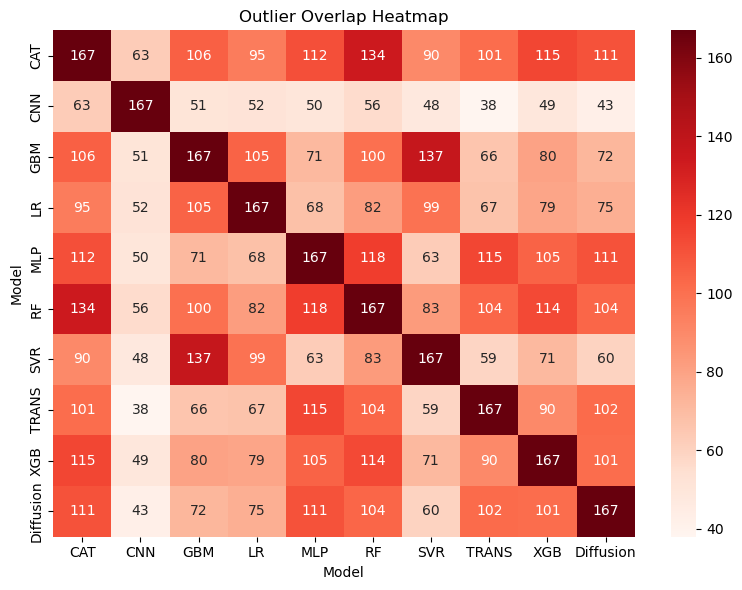

In [7]:
# Calculate the overlap matrix for outlier indices between models
outlier_indices = {col: set(outlier_df[col].index) for col in model_list}
import numpy as np

# Initialize the overlap matrix
overlap_matrix = np.zeros((len(model_list), len(model_list)), dtype=int)
for i, model_i in enumerate(model_list):
    for j, model_j in enumerate(model_list):
        # Count the number of overlapping outlier indices between two models
        overlap_matrix[i, j] = len(outlier_indices[model_i] & outlier_indices[model_j])

import seaborn as sns
import matplotlib.pyplot as plt

# Plot the overlap matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(overlap_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=model_list, yticklabels=model_list)
plt.title("Outlier Overlap Heatmap")
plt.xlabel("Model")
plt.ylabel("Model")
plt.tight_layout()
plt.show()

## outlier count

In [8]:
# Sort value_counts by the outlier_count value (index), not by count
print(test_with_pred["outlier_count"].value_counts().sort_index(ascending=False))

outlier_count
10      12
9       27
8       25
7       20
6       36
5       24
4       32
3       49
2       64
1      228
0     2817
Name: count, dtype: int64


# pca and umap for substrate

In [9]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
pca.fit(np.vstack(data_with_pred["metabolite_features"].values))
X_pca = pca.fit_transform(np.vstack(test_with_pred["metabolite_features"].values))
test_with_pred["PCA_feature"] = [x.tolist() for x in X_pca]
data_with_pred["PCA_feature"] = [x.tolist() for x in pca.transform(np.vstack(data_with_pred["metabolite_features"].values))]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XGB_is_outlier,Diffusion_is_outlier,outlier_count,PCA_feature
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",-1.303196,-0.837739,-1.420093,-0.639996,-0.603394,-0.513698,-0.657402,-0.693497,0.215435,-1.201625,-0.139242,0.465457,-0.116897,0.663200,0.699803,0.789498,0.645794,0.609699,1.518631,0.101571,1.163954,4,4_Lyases,0,0,0,0,0,0,0,0,0,0,0,"[1.3930027484893799, -5.4955034255981445, 0.42..."
20,1.1.1.22,Homo sapiens,C1=CN(C(=O)NC1=O)C2C(C(C(O2)COP(=O)(O)OP(=O)(O...,UDP-D-galactose,MFEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWN...,0.0200,s^(-1),-1.698970,"[0.20797633, -0.65783435, -0.9539016, 0.431711...","[-0.010068754, -0.13892373, 0.018177293, 0.096...",1.698970,-0.974531,-0.419111,-0.807148,-0.800171,-1.817808,-1.702134,-0.591746,-1.830076,-1.282809,-1.547057,-2.673501,-2.118081,-2.506118,-2.499141,-3.516778,-3.401104,-2.290716,-3.529046,-2.981779,-3.246027,1,1_Oxidoreductases,1,1,0,0,1,1,0,1,1,1,7,"[-5.226370334625244, -3.4116060733795166, 1.83..."
21,1.1.1.22,Homo sapiens,C1=CC(=C[N+](=C1)C2C(C(C(O2)COP(=O)([O-])OP(=O...,NAD+,MFEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWN...,0.0550,s^(-1),-1.259637,"[0.3175878, 0.010024521, -0.78843665, 0.178402...","[-0.010068754, -0.13892373, 0.018177293, 0.096...",1.259637,-1.158752,-0.654226,-0.924158,-1.171509,-1.791024,-1.653612,-0.922207,-1.892909,-1.206955,-1.745498,-2.418389,-1.913863,-2.183795,-2.431146,-3.050662,-2.913249,-2.181844,-3.152547,-2.466592,-3.005135,1,1_Oxidoreductases,0,0,0,0,1,1,0,1,0,1,4,"[-6.267266750335693, 1.3814706802368164, -0.64..."
30,5.4.2.10,Escherichia coli,C(C1C(C(C(C(O1)OP(=O)(O)O)O)O)O)O,beta-D-Glucose 1-phosphate,MSNRKYFGTDGIRGRVGDAPITPDFVLKLGWAAGKVLARHGSRKII...,0.0138,s^(-1),-1.860121,"[0.7184309, -0.4804951, -0.47717008, 0.5239590...","[-0.047760006, -0.08816346, -0.004194439, 0.13...",1.860121,-0.719235,1.750646,-0.622760,-1.482300,-0.332929,-0.730599,-1.116150,-0.653246,-0.535518,-0.424661,-2.579356,-0.109475,-2.482881,-3.342421,-2.193050,-2.590720,-2.976271,-2.513367,-2.395639,-2.284781,5,5_Isomerases,1,0,0,1,0,1,1,0,0,0,4,"[-1.7553446292877197, -1.028274416923523, 4.93..."
31,5.4.2.10,Escherichia coli,C(C1C(C(C(C(O1)O)N)O)O)OP(=O)(O)O,D-Glucosamine 6-phosphate,MSNRKYFGTDGIRGRVGDAPITPDFVLKLGWAAGKVLARHGSRKII...,7.9000,s^(-1),0.897627,"[0.73848176, -0.5075934, -0.68309057, 0.576750...","[-0.047760006, -0.08816346, -0.004194439, 0.13...",-0.897627,-0.802261,-0.672659,-0.529656,-1.123901,-0.481919,-0.955125,-0.749413,-1.602516,-0.502200,-0.717609,0.095366,0.224968,0.367972,-0.226274,0.415708,-0.057498,0.148214,-0.704889,0.395427,0.180018,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-1.1655519008636475, -2.308785915374756, 4.73..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16994,3.4.16.5,Homo sapiens,CCOC(=O)C(CC1=CC=C(C=C1)O)NC(=O)C2=CC=CC=C2,N-Benzoyl-L-tyrosine ethyl ester,MIRAAPPPLFLLLLLLLLLVSWASRGEAAPDQDEIQRLPGLAKQPS...,519.3000,s^(-1),2.715418,"[0.25892147, 0.38879254, -0.2991348, -0.274140...","[0.034848142, -0.29681024, 0.16357915, 0.17838...",-2.715418,-0.704163,-2.952625,-0.718884,-2.989258,-0.135015,-0.707965,-1.043392,0.265425,0.245170,-0.302066,2.011255,-0.237206,1.996535,-0.273839,2.580404,2.007453,1.672027,2.980843

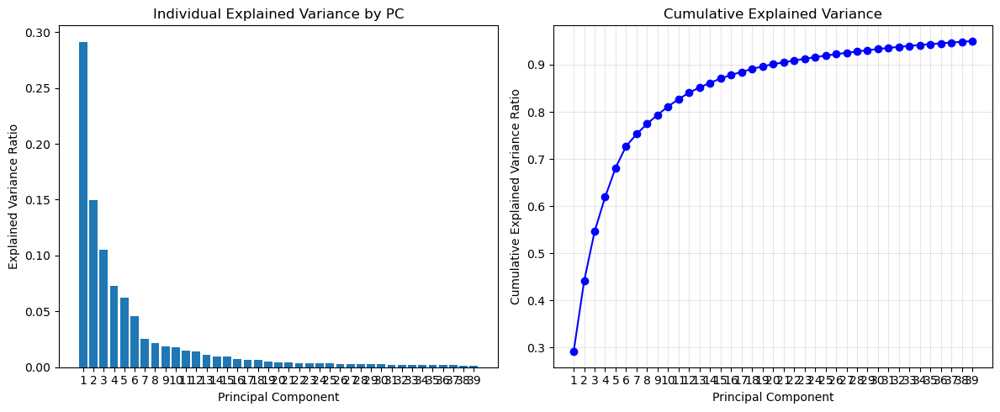

In [10]:
# 繪製 variance 解釋比例圖
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(12, 5))

# Individual variance plot
plt.subplot(1, 2, 1)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Individual Explained Variance by PC')
plt.xticks(range(1, len(explained_variance_ratio) + 1))

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance) + 1))
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [11]:
data_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,PCA_feature
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",-1.303196,-0.837739,-1.420093,-0.639996,-0.603394,-0.513698,-0.657402,-0.693497,0.215435,-1.201625,-0.139242,0.465457,-0.116897,0.663200,0.699803,0.789498,0.645794,0.609699,1.518631,0.101571,1.163954,4,4_Lyases,"[1.3929898738861084, -5.495492935180664, 0.420..."
1,4.2.3.4,Aspergillus nidulans,C(C(C(C(COP(=O)([O-])[O-])O)O)O)C(=O)C(=O)[O-],3-deoxy-D-arabino-heptulosonate 7-phosphate,MSNPTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTN...,6.8000,s^(-1),0.832509,"[0.4610253, 0.039623156, -0.4662559, 0.4188257...","[-0.10084063, -0.099633686, -0.011382125, 0.10...",-0.832509,-0.769882,-0.851817,-0.618378,-0.497681,-0.886814,-0.599505,-0.599841,-0.976604,-0.772597,-0.748740,0.062626,-0.019308,0.214131,0.334828,-0.054305,0.233004,0.232668,-0.144095,0.059912,0.083769,4,4_Lyases,"[1.935490369796753, -3.2252159118652344, 2.284..."
2,4.2.3.4,Neurospora crassa,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAEPISNPTRINILGKDNIIIDHGIWLNFVAQDLLQNIKSSTYILI...,19.0000,s^(-1),1.278754,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12705962, -0.09898393, 0.0041820942, 0.096...",-1.278754,-0.791906,-1.101037,-0.678927,-0.072388,-1.477992,-1.234105,-0.767314,-1.359042,-0.816694,-1.206407,0.486848,0.177716,0.599826,1.206366,-0.199238,0.044649,0.511439,-0.080288,0.462060,0.072347,4,4_Lyases,"[1.3929898738861084, -5.495492935180664, 0.420..."
3,2.1.1.255,Streptomyces coelicolor,C[S+](CCC(C(=O)[O-])N)CC1C(C(C(O1)N2C=NC3=C(N=...,S-Adenosyl-L-methionine,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0075,s^(-1),-2.124939,"[0.52348095, -0.18665986, -0.39555183, 0.11716...","[0.0015065962, -0.087554656, -0.014490904, -0....",2.124939,1.518173,1.764006,0.949620,0.650879,2.154332,1.583717,0.969637,2.058942,1.879873,1.582940,-0.606766,-0.360932,-1.175319,-1.474060,0.029394,-0.541222,-1.155302,-0.065997,-0.245066,-0.541999,2,2_Transferases,"[-4.479373931884766, 1.623438835144043, 0.2289..."
4,2.1.1.255,Streptomyces coelicolor,CC(=CCCC(=C(C)COP(=O)(O)OP(=O)(O)O)C)C,(E)-2-Methylgeranyl diphosphate,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0390,s^(-1),-1.408935,"[0.17630623, -0.4595529, -0.6368343, -0.136045...","[0.0015065962, -0.087554656, -0.014490904, -0....",1.408935,0.875806,1.351525,0.264406,0.861206,1.350158,1.159209,0.684531,1.401160,1.029192,1.300688,-0.533129,-0.057410,-1.144530,-0.547729,-0.058778,-0.249726,-0.724405,-0.007775,-0.379744,-0.108247,2,2_Transferases,"[2.5224711894989014, -4.61094856262207, -0.839..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17005,1.1.1.82,Zea mays,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADPH,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,955.0000,s^(-1),2.980003,"[0.36284313, -0.21340896, -0.8913718, -0.23485...","[0.039386757, -0.04558141, 0.101506, 0.1012840...",-2.980003,-1.675240,-0.934714,-1.252118,-1.454468,-2.898621,-2.190113,-1.317105,-3.162912,-1.582371,-2.568395,1.304763,2.045289,1.727886,1.525536,0.081383,0.789890,1.662899,-0.182908,1.397632,0.411608,1,1_Oxidoreductases,"[-6.617237567901611, 0.27029138803482056, 0.17..."
17006,1.1.1.82,Zea mays,C(C(C(=O)O)O)C(=O)O,L-Malate,MGLSTVYSPAGPRLVPAPLGRCRSAQPRRPRRAPLATVRCSVDATK...,2.9000,s^(-1),0.462398,"[0.045168612, -0.31311044, -0.21087039, -0.292...","[0.039386757, -0

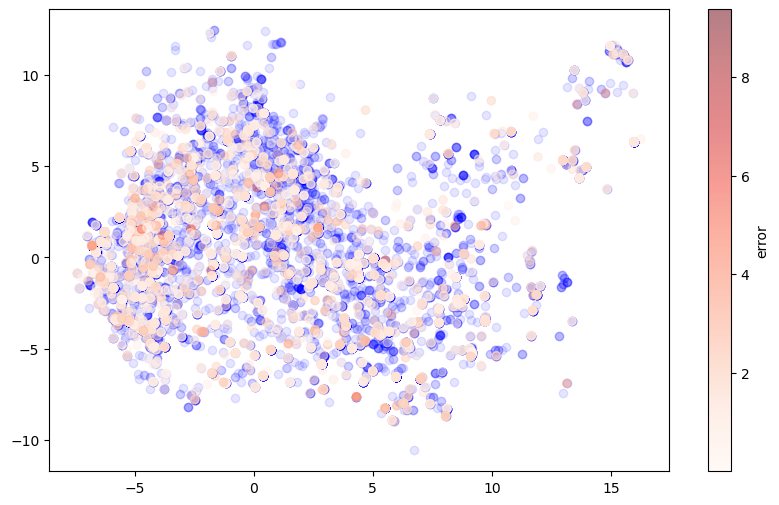

In [12]:
plt.figure(figsize=(10, 6))
pc1_values = [pca_feat[0] for pca_feat in test_with_pred["PCA_feature"]]
pc2_values = [pca_feat[1] for pca_feat in test_with_pred["PCA_feature"]]

plt.scatter(
    [pca_feat[0] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature"]],
    [pca_feat[1] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature"]],
    color="b",
    alpha=0.1,
)
plt.scatter(
    pc1_values,
    pc2_values,
    c=np.abs(test_with_pred["CAT_error"]),
    cmap="Reds",
    alpha=0.5,
)

# plt.scatter(


plt.colorbar(label='error')
plt.show()

In [13]:

import umap
import sklearn
print(f"UMAP version: {umap.__version__}")
print(f"scikit-learn version: {sklearn.__version__}")



UMAP version: 0.5.3
scikit-learn version: 1.2.2


In [14]:
from umap import UMAP
import matplotlib.pyplot as plt
# delete the duplicate rows
X_all = np.vstack(data_with_pred["metabolite_features"].values)
X_test = np.vstack(test_with_pred["metabolite_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"origional data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use the unique rows to train UMAP
umap_reducer = UMAP(
    n_components=2, 
    random_state=42,
    n_neighbors=15,
    min_dist=0.1
)
umap_reducer.fit(unique_rows)

# transform the test data
X_umap = umap_reducer.transform(X_test)

# save UMAP results to DataFrame
test_with_pred["UMAP_feature"] = [x.tolist() for x in X_umap]
data_with_pred["UMAP_feature"] = [x.tolist() for x in umap_reducer.transform(X_all)]



origional data: 17010 points
reduced data: 2706 points


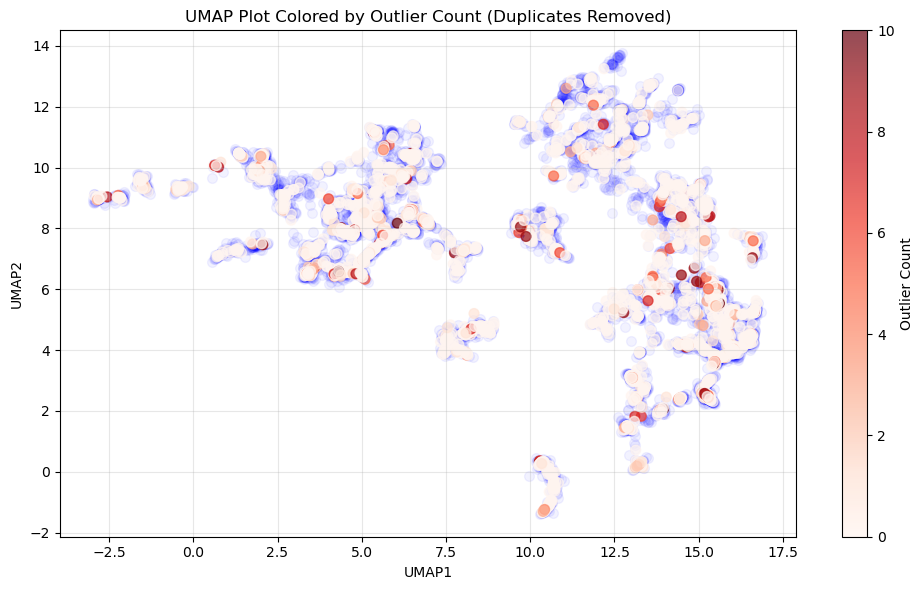

In [15]:

# plot UMAP
plt.figure(figsize=(10, 6))
umap1_values = [umap_feat[0] for umap_feat in test_with_pred["UMAP_feature"]]
umap2_values = [umap_feat[1] for umap_feat in test_with_pred["UMAP_feature"]]
umap1_values_train = [umap_feat[0] for umap_feat in data_with_pred.loc[index_info['train_index'],"UMAP_feature"]]
umap2_values_train = [umap_feat[1] for umap_feat in data_with_pred.loc[index_info['train_index'],"UMAP_feature"]]

plt.scatter(
    umap1_values_train,
    umap2_values_train,
    color="b",
    alpha=0.05,
    s=50
)
plt.scatter(
    umap1_values,
    umap2_values,
    c=test_with_pred["outlier_count"],
    cmap="Reds",
    alpha=0.7,
    s=50
)
plt.colorbar(label='Outlier Count')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP Plot Colored by Outlier Count (Duplicates Removed)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/umap_plot.png",dpi=600)
plt.savefig("./outlier_data/umap_plot.svg")
plt.show()

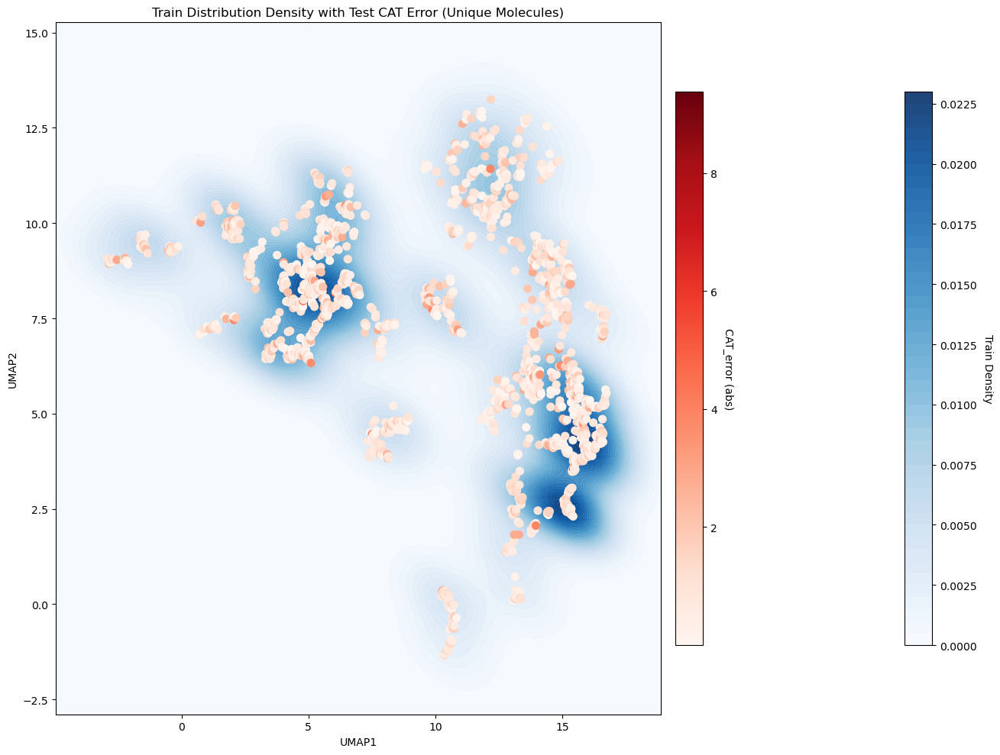

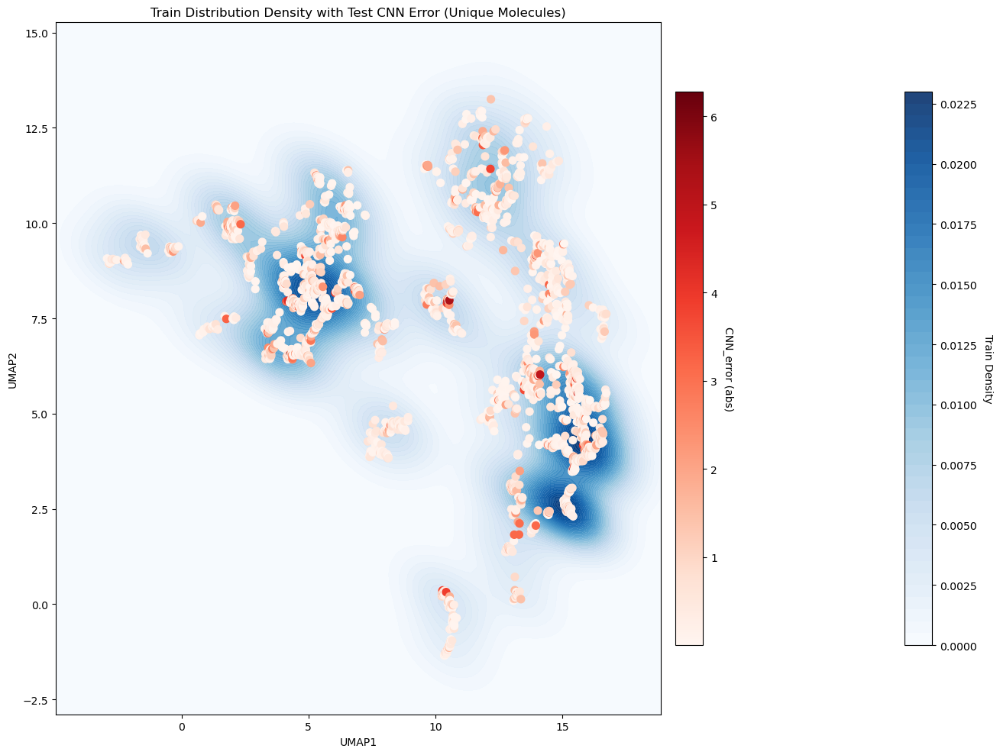

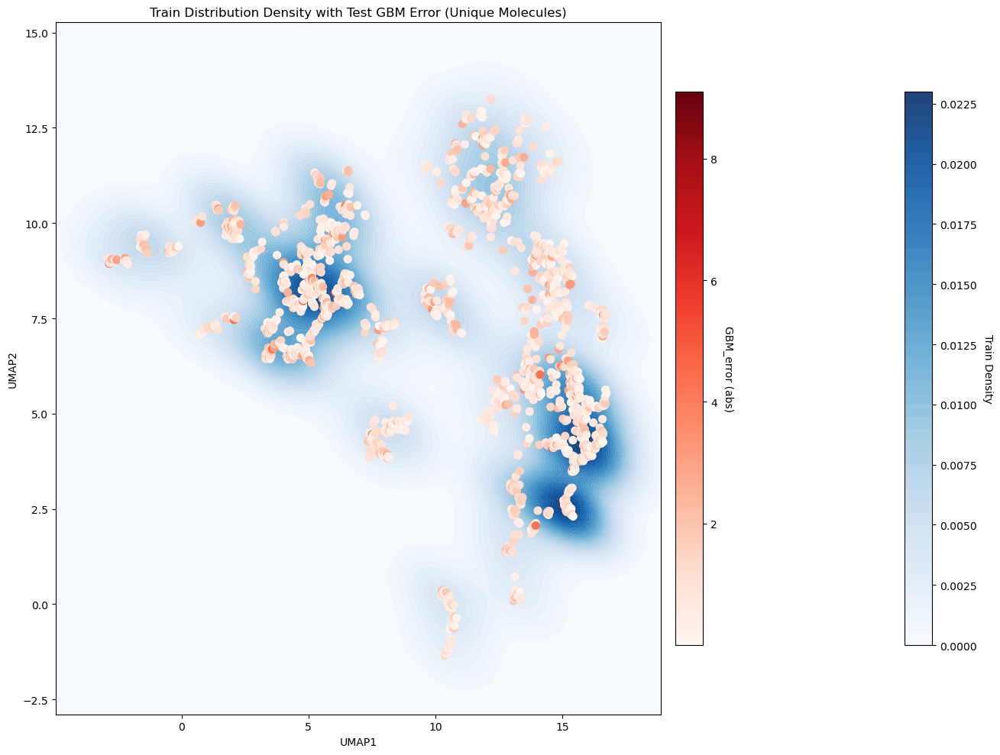

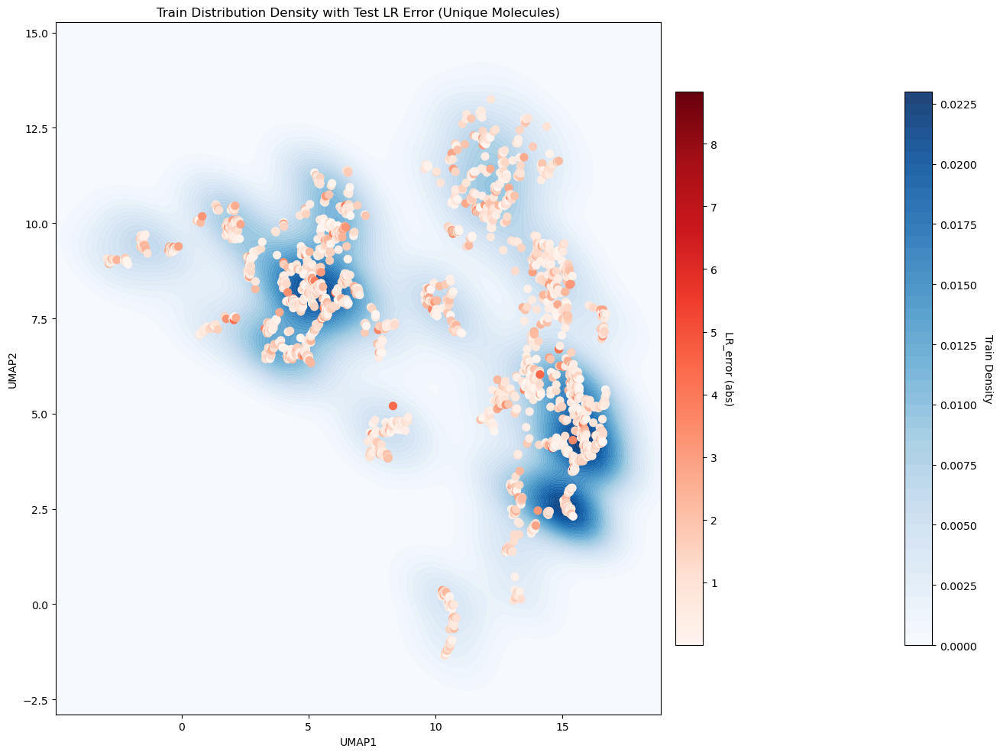

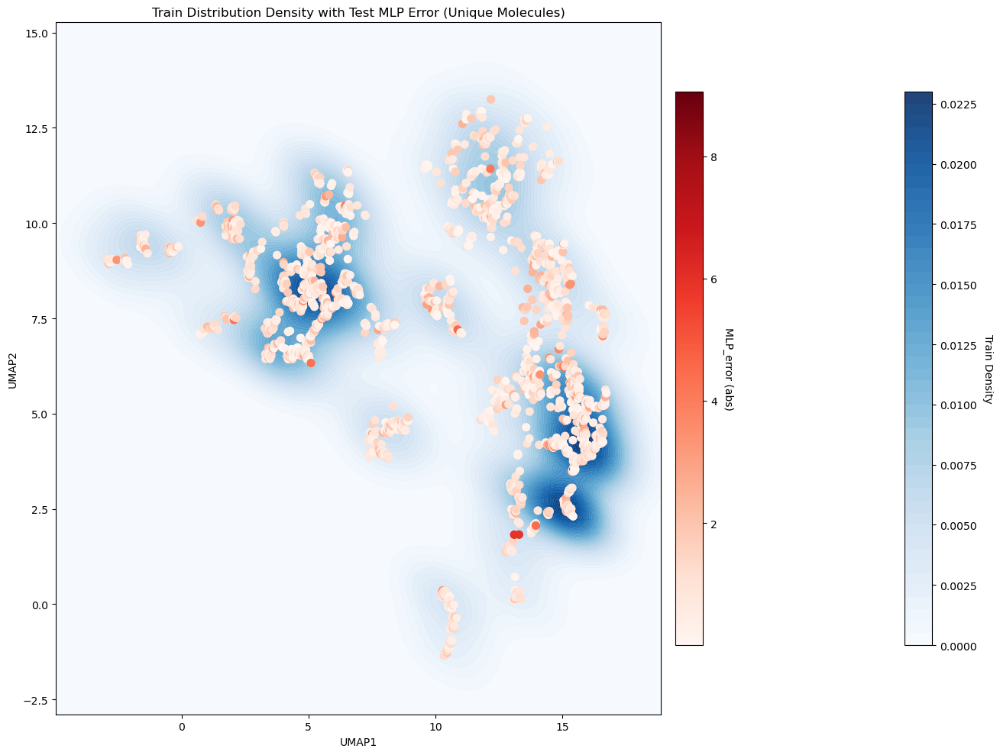

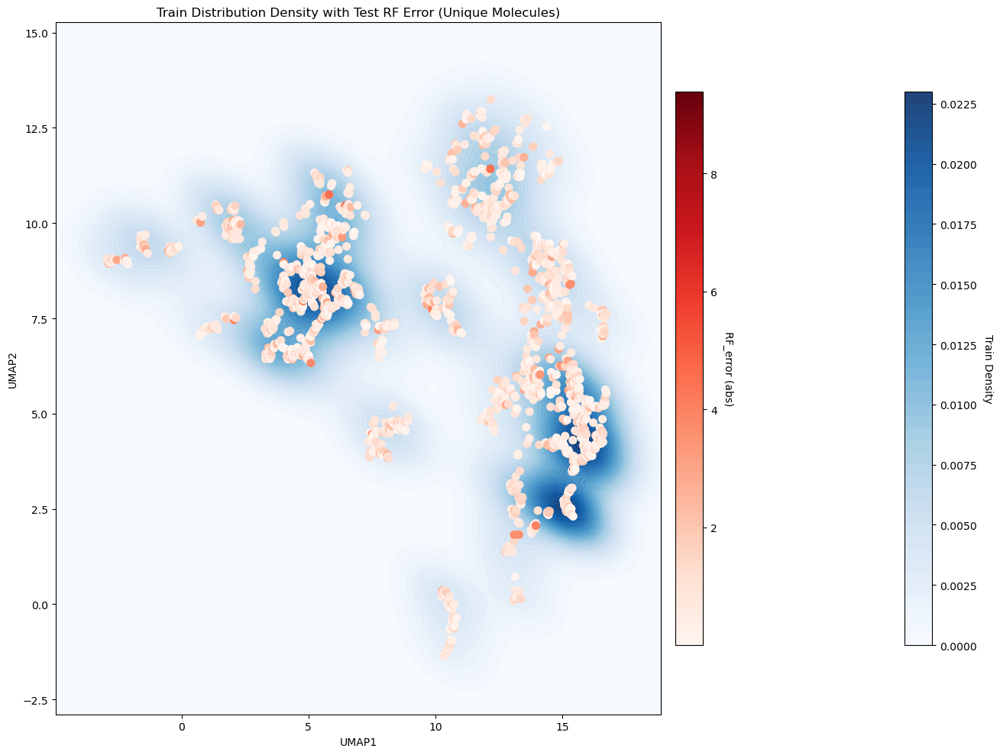

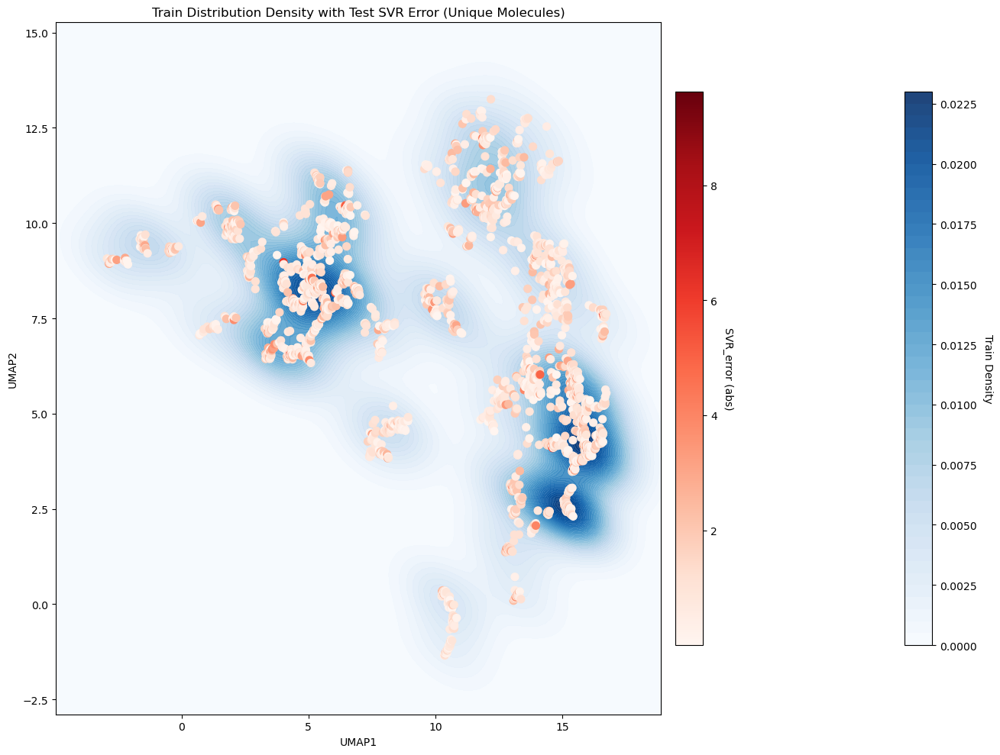

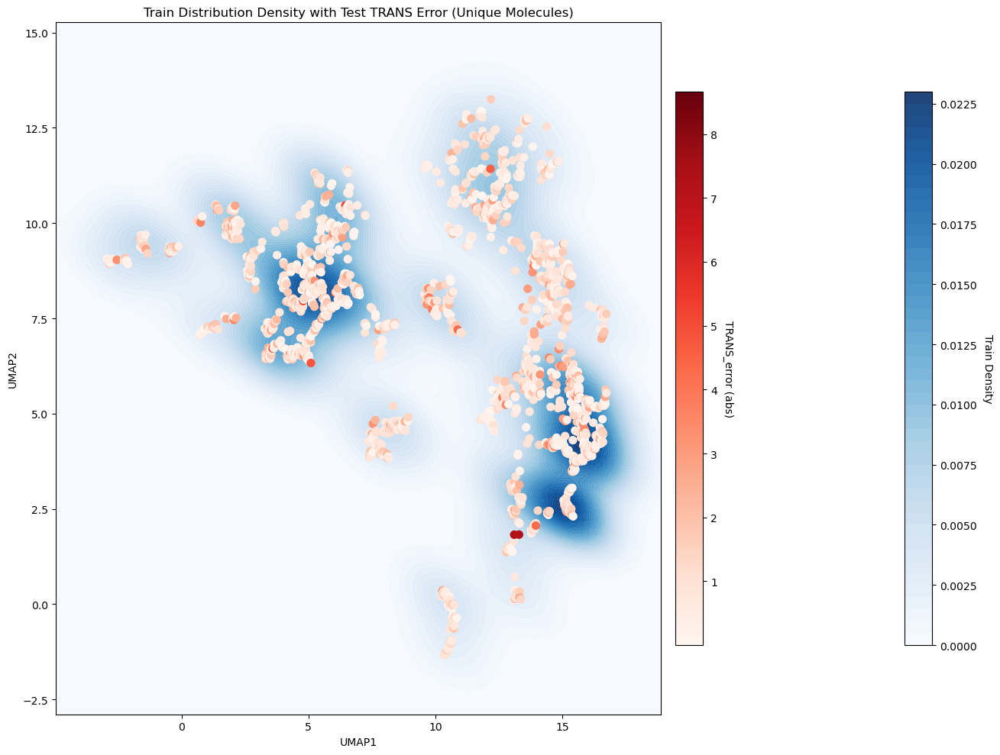

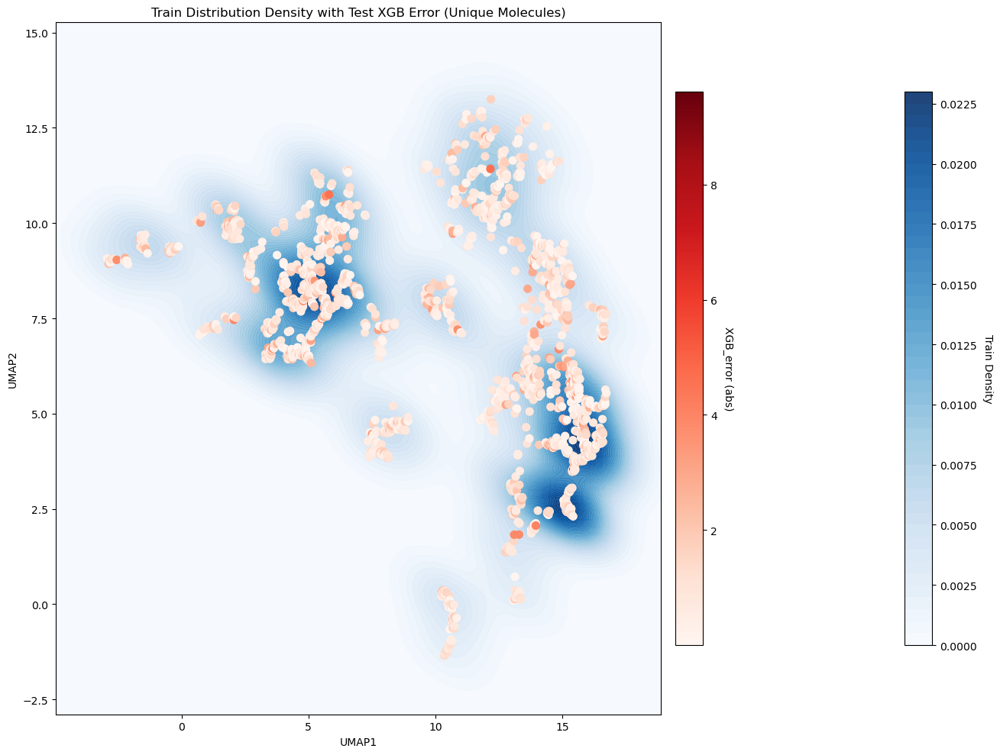

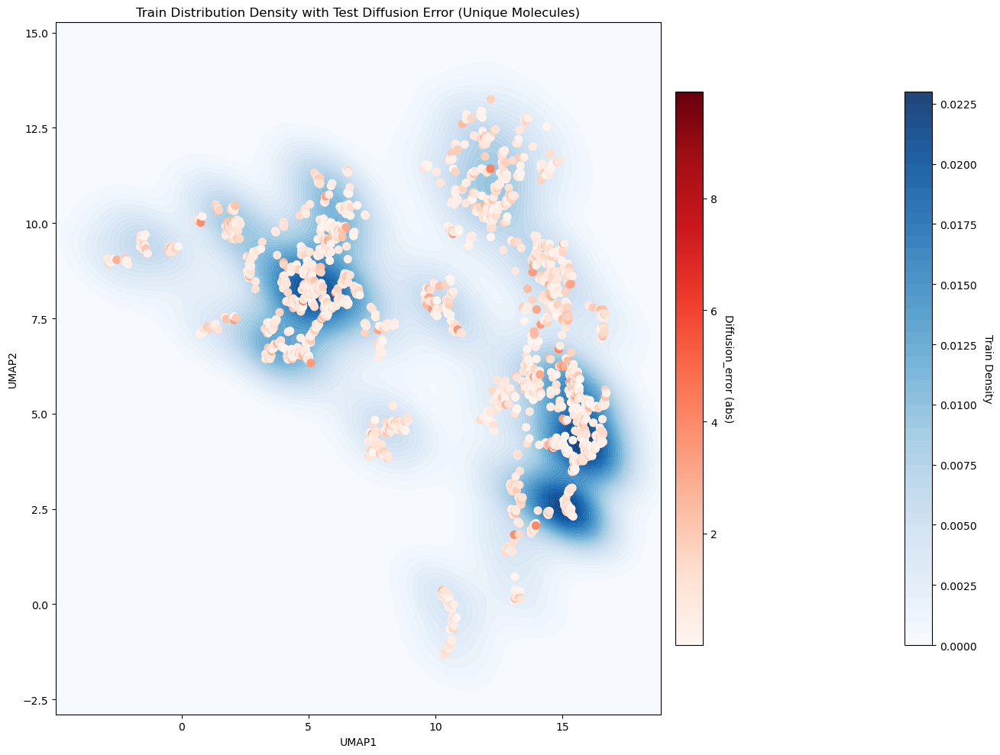

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get UMAP features for training set
umap_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "UMAP_feature"]])

# Create grid (with padding)
x_padding = (umap_train[:, 0].max() - umap_train[:, 0].min()) * 0.1
y_padding = (umap_train[:, 1].max() - umap_train[:, 1].min()) * 0.1

x_min, x_max = umap_train[:, 0].min() - x_padding, umap_train[:, 0].max() + x_padding
y_min, y_max = umap_train[:, 1].min() - y_padding, umap_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(umap_train.T)
density = kde(grid_points).reshape(xx.shape)

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])
    
    # Group by UMAP coordinates and keep only the maximum error for each unique molecule
    test_filtered['umap_coord'] = test_filtered['UMAP_feature'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('umap_coord')['abs_error'].idxmax()]
    
    # Extract coordinates for plotting
    umap1_values_unique = [umap_feat[0] for umap_feat in test_unique["UMAP_feature"]]
    umap2_values_unique = [umap_feat[1] for umap_feat in test_unique["UMAP_feature"]]
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap (修改：使藍色更深)
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9)
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot (unique molecules only)
    scatter = ax.scatter(
        umap1_values_unique,
        umap2_values_unique,
        c=test_unique['abs_error'],
        cmap="Reds",
        alpha=1,
        s=50
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02)
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_title(f'Train Distribution Density with Test {col} Error (Unique Molecules)')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/umap_density_mol_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/umap_density_mol_plot_{col}.svg")
    plt.show()

# pca and umap for protein



In [17]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
pca.fit(np.vstack(data_with_pred["protein_features"].values))
X_pca = pca.fit_transform(np.vstack(test_with_pred["protein_features"].values))
test_with_pred["PCA_feature_protein"] = [x.tolist() for x in X_pca]
data_with_pred["PCA_feature_protein"] = [x.tolist() for x in pca.transform(np.vstack(data_with_pred["protein_features"].values))]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XGB_is_outlier,Diffusion_is_outlier,outlier_count,PCA_feature,UMAP_feature,PCA_feature_protein
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",-1.303196,-0.837739,-1.420093,-0.639996,-0.603394,-0.513698,-0.657402,-0.693497,0.215435,-1.201625,-0.139242,0.465457,-0.116897,0.663200,0.699803,0.789498,0.645794,0.609699,1.518631,0.101571,1.163954,4,4_Lyases,0,0,0,0,0,0,0,0,0,0,0,"[1.3930027484893799, -5.4955034255981445, 0.42...","[5.29396390914917, 7.346439361572266]","[1.0998235940933228, 0.2155243307352066, 0.305..."
20,1.1.1.22,Homo sapiens,C1=CN(C(=O)NC1=O)C2C(C(C(O2)COP(=O)(O)OP(=O)(O...,UDP-D-galactose,MFEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWN...,0.0200,s^(-1),-1.698970,"[0.20797633, -0.65783435, -0.9539016, 0.431711...","[-0.010068754, -0.13892373, 0.018177293, 0.096...",1.698970,-0.974531,-0.419111,-0.807148,-0.800171,-1.817808,-1.702134,-0.591746,-1.830076,-1.282809,-1.547057,-2.673501,-2.118081,-2.506118,-2.499141,-3.516778,-3.401104,-2.290716,-3.529046,-2.981779,-3.246027,1,1_Oxidoreductases,1,1,0,0,1,1,0,1,1,1,7,"[-5.226370334625244, -3.4116060733795166, 1.83...","[14.475533485412598, 2.4108517169952393]","[-0.32482418417930603, 0.534259021282196, 0.18..."
21,1.1.1.22,Homo sapiens,C1=CC(=C[N+](=C1)C2C(C(C(O2)COP(=O)([O-])OP(=O...,NAD+,MFEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWN...,0.0550,s^(-1),-1.259637,"[0.3175878, 0.010024521, -0.78843665, 0.178402...","[-0.010068754, -0.13892373, 0.018177293, 0.096...",1.259637,-1.158752,-0.654226,-0.924158,-1.171509,-1.791024,-1.653612,-0.922207,-1.892909,-1.206955,-1.745498,-2.418389,-1.913863,-2.183795,-2.431146,-3.050662,-2.913249,-2.181844,-3.152547,-2.466592,-3.005135,1,1_Oxidoreductases,0,0,0,0,1,1,0,1,0,1,4,"[-6.267266750335693, 1.3814706802368164, -0.64...","[15.210460662841797, 2.454906463623047]","[-0.32482919096946716, 0.5342592597007751, 0.1..."
30,5.4.2.10,Escherichia coli,C(C1C(C(C(C(O1)OP(=O)(O)O)O)O)O)O,beta-D-Glucose 1-phosphate,MSNRKYFGTDGIRGRVGDAPITPDFVLKLGWAAGKVLARHGSRKII...,0.0138,s^(-1),-1.860121,"[0.7184309, -0.4804951, -0.47717008, 0.5239590...","[-0.047760006, -0.08816346, -0.004194439, 0.13...",1.860121,-0.719235,1.750646,-0.622760,-1.482300,-0.332929,-0.730599,-1.116150,-0.653246,-0.535518,-0.424661,-2.579356,-0.109475,-2.482881,-3.342421,-2.193050,-2.590720,-2.976271,-2.513367,-2.395639,-2.284781,5,5_Isomerases,1,0,0,1,0,1,1,0,0,0,4,"[-1.7553446292877197, -1.028274416923523, 4.93...","[4.191223621368408, 6.500374794006348]","[-0.5899785757064819, 0.33521348237991333, 0.9..."
31,5.4.2.10,Escherichia coli,C(C1C(C(C(C(O1)O)N)O)O)OP(=O)(O)O,D-Glucosamine 6-phosphate,MSNRKYFGTDGIRGRVGDAPITPDFVLKLGWAAGKVLARHGSRKII...,7.9000,s^(-1),0.897627,"[0.73848176, -0.5075934, -0.68309057, 0.576750...","[-0.047760006, -0.08816346, -0.004194439, 0.13...",-0.897627,-0.802261,-0.672659,-0.529656,-1.123901,-0.481919,-0.955125,-0.749413,-1.602516,-0.502200,-0.717609,0.095366,0.224968,0.367972,-0.226274,0.415708,-0.057498,0.148214,-0.704889,0.395427,0.180018,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-1.1655519008636475, -2.308785915374756, 4.73...","[4.589285850524902, 6.546300411224365]","[-0.5899783968925476, 0.3352140784263611, 0.98..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

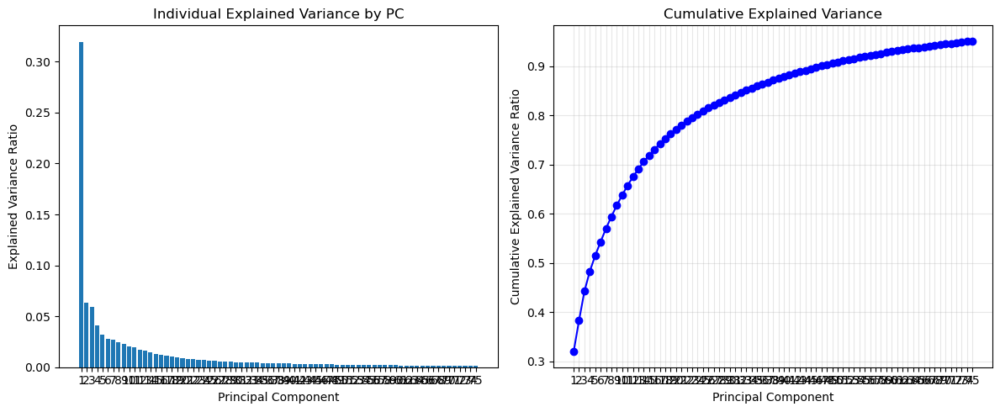

In [18]:
# 繪製 variance 解釋比例圖
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(12, 5))

# Individual variance plot
plt.subplot(1, 2, 1)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Individual Explained Variance by PC')
plt.xticks(range(1, len(explained_variance_ratio) + 1))

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance) + 1))
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

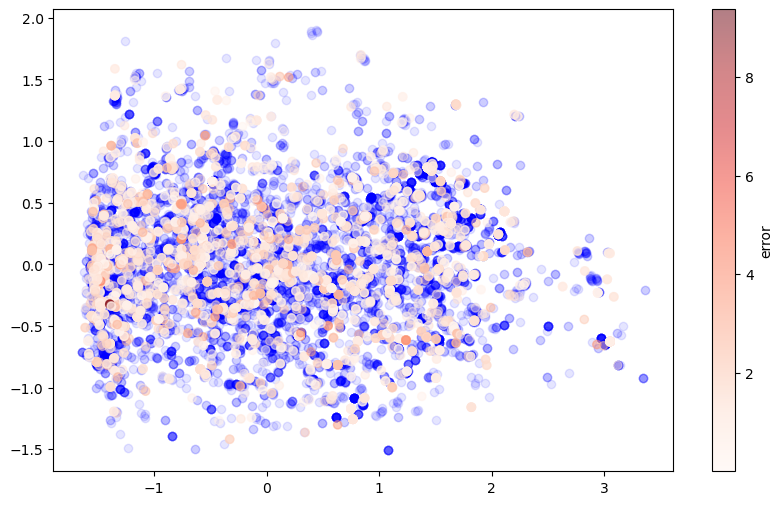

In [19]:
plt.figure(figsize=(10, 6))
pc1_values = [pca_feat[0] for pca_feat in test_with_pred["PCA_feature_protein"]]
pc2_values = [pca_feat[1] for pca_feat in test_with_pred["PCA_feature_protein"]]

plt.scatter(
    [pca_feat[0] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature_protein"]],
    [pca_feat[1] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature_protein"]],
    color="b",
    alpha=0.1,
)
plt.scatter(
    pc1_values,
    pc2_values,
    c=np.abs(test_with_pred["CAT_error"]),
    cmap="Reds",
    alpha=0.5,
)

# plt.scatter(


plt.colorbar(label='error')
plt.show()

In [20]:
from umap import UMAP
import matplotlib.pyplot as plt

# delete the duplicate rows
X_all = np.vstack(data_with_pred["protein_features"].values)
X_test = np.vstack(test_with_pred["protein_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"origional data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use the unique rows to train UMAP
umap_reducer = UMAP(
    n_components=2, 
    random_state=42,
    n_neighbors=30,
    min_dist=0.5,
    metric='correlation'
)
umap_reducer.fit(unique_rows)

# transform the test data
X_umap = umap_reducer.transform(X_test)

# save UMAP results to DataFrame
test_with_pred["UMAP_feature_protein"] = [x.tolist() for x in X_umap]
data_with_pred["UMAP_feature_protein"] = [x.tolist() for x in umap_reducer.transform(X_all)]

origional data: 17010 points
reduced data: 7857 points


In [21]:
data_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XGB_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XGB_error,Diffusion_error,protein_id,protein_label,PCA_feature,UMAP_feature,PCA_feature_protein,UMAP_feature_protein
0,4.2.3.4,Actinidia chinensis,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAAFSLSAKQILSPSTHRPSLSKTTTADSSLRFRNPHSLSLRCSSL...,20.1000,s^(-1),1.303196,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12646541, -0.15512069, 0.0834027, 0.213126...",-1.303196,-0.837739,-1.420093,-0.639996,-0.603394,-0.513698,-0.657402,-0.693497,0.215435,-1.201625,-0.139242,0.465457,-0.116897,0.663200,0.699803,0.789498,0.645794,0.609699,1.518631,0.101571,1.163954,4,4_Lyases,"[1.3929898738861084, -5.495492935180664, 0.420...","[5.337472438812256, 7.389566421508789]","[1.0998203754425049, 0.21552543342113495, 0.30...","[0.13427016139030457, -3.2103164196014404]"
1,4.2.3.4,Aspergillus nidulans,C(C(C(C(COP(=O)([O-])[O-])O)O)O)C(=O)C(=O)[O-],3-deoxy-D-arabino-heptulosonate 7-phosphate,MSNPTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTN...,6.8000,s^(-1),0.832509,"[0.4610253, 0.039623156, -0.4662559, 0.4188257...","[-0.10084063, -0.099633686, -0.011382125, 0.10...",-0.832509,-0.769882,-0.851817,-0.618378,-0.497681,-0.886814,-0.599505,-0.599841,-0.976604,-0.772597,-0.748740,0.062626,-0.019308,0.214131,0.334828,-0.054305,0.233004,0.232668,-0.144095,0.059912,0.083769,4,4_Lyases,"[1.935490369796753, -3.2252159118652344, 2.284...","[2.5731775760650635, 9.082439422607422]","[-0.38697904348373413, 0.2344420850276947, 0.3...","[1.9961323738098145, -0.32733631134033203]"
2,4.2.3.4,Neurospora crassa,C(C(C(C(COP(=O)(O)O)O)O)O)C(=O)C(=O)O,3-deoxy-D-arabino-heptulosonic acid 7-phosphate,MAEPISNPTRINILGKDNIIIDHGIWLNFVAQDLLQNIKSSTYILI...,19.0000,s^(-1),1.278754,"[0.09045384, -0.6035856, -0.5294743, 0.0703877...","[-0.12705962, -0.09898393, 0.0041820942, 0.096...",-1.278754,-0.791906,-1.101037,-0.678927,-0.072388,-1.477992,-1.234105,-0.767314,-1.359042,-0.816694,-1.206407,0.486848,0.177716,0.599826,1.206366,-0.199238,0.044649,0.511439,-0.080288,0.462060,0.072347,4,4_Lyases,"[1.3929898738861084, -5.495492935180664, 0.420...","[5.4020304679870605, 7.388605117797852]","[-0.17752136290073395, 0.17665454745292664, 0....","[2.0600340366363525, -0.8465989232063293]"
3,2.1.1.255,Streptomyces coelicolor,C[S+](CCC(C(=O)[O-])N)CC1C(C(C(O1)N2C=NC3=C(N=...,S-Adenosyl-L-methionine,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0075,s^(-1),-2.124939,"[0.52348095, -0.18665986, -0.39555183, 0.11716...","[0.0015065962, -0.087554656, -0.014490904, -0....",2.124939,1.518173,1.764006,0.949620,0.650879,2.154332,1.583717,0.969637,2.058942,1.879873,1.582940,-0.606766,-0.360932,-1.175319,-1.474060,0.029394,-0.541222,-1.155302,-0.065997,-0.245066,-0.541999,2,2_Transferases,"[-4.479373931884766, 1.623438835144043, 0.2289...","[16.038673400878906, 5.2538161277771]","[-0.2347557246685028, -0.7228483557701111, 0.1...","[-3.4832565784454346, 4.661518096923828]"
4,2.1.1.255,Streptomyces coelicolor,CC(=CCCC(=C(C)COP(=O)(O)OP(=O)(O)O)C)C,(E)-2-Methylgeranyl diphosphate,MTTETTTATATAKIPAPATPYQEDIARYWNNEARPVNLRLGDVDGL...,0.0390,s^(-1),-1.408935,"[0.17630623, -0.4595529, -0.6368343, -0.136045...","[0.0015065962, -0.087554656, -0.014490904, -0....",1.408935,0.875806,1.351525,0.264406,0.861206,1.350158,1.159209,0.684531,1.401160,1.029192,1.300688,-0.533129,-0.057410,-1.144530,-0.547729,-0.058778,-0.249726,-0.724405,-0.007775,-0.379744,-0.108247,2,2_Transferases,"[2.5224711894989014, -4.61094856262207, -0.839...","[6.923361301422119, 8.147430419921875]","[-0.2347557246685028, -0.7228483557701111, 0.1...","[-3.4040915966033936, 4.848831653594971]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

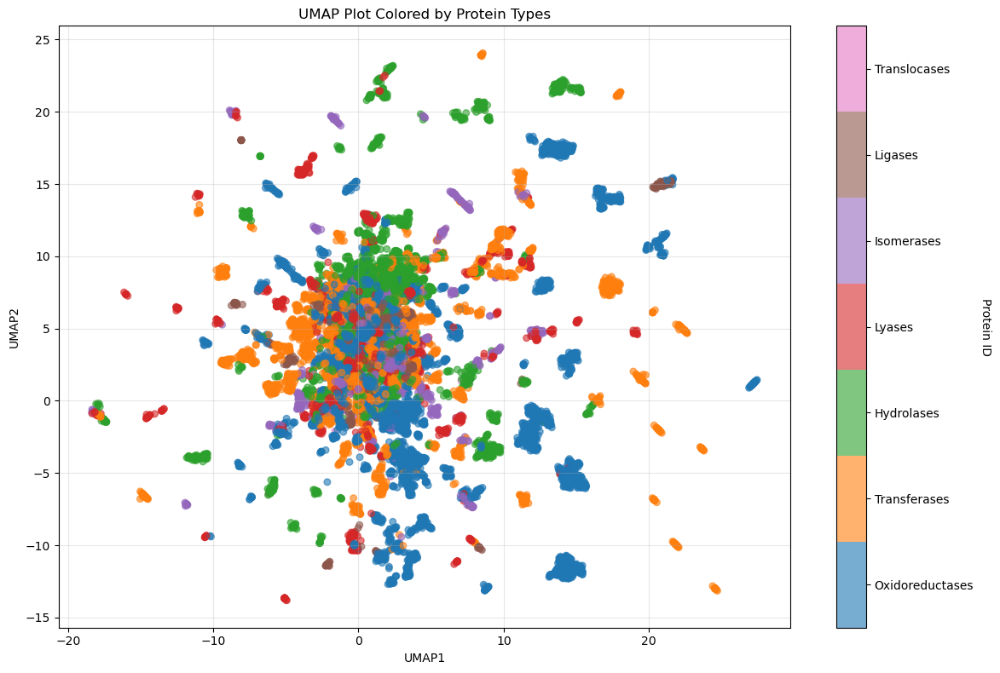

In [22]:
# Plot UMAP with different protein types colored
plt.figure(figsize=(12, 8))

# Get UMAP coordinates for all data
umap1_values_all = [umap_feat[0] for umap_feat in data_with_pred["UMAP_feature_protein"]]
umap2_values_all = [umap_feat[1] for umap_feat in data_with_pred["UMAP_feature_protein"]]

from matplotlib.colors import ListedColormap
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
cmap_7 = ListedColormap(colors)


# Use protein_id - 1 to map protein_id 1-7 to colormap indices 0-6
scatter = plt.scatter(
    umap1_values_all,
    umap2_values_all,
    c=data_with_pred['protein_id'] - 1,
    alpha=0.6,
    s=30,
    cmap=cmap_7,
    vmin=0,
    vmax=7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Protein ID', rotation=270, labelpad=15)

# Set ticks at the center of each color block
cbar.set_ticks([i + 0.5 for i in range(7)])
cbar.set_ticklabels([PROTEIN_TYPES_NAMES[i] for i in range(1, 8)])

plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP Plot Colored by Protein Types')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/umap_protein_types.png", dpi=1200)
plt.savefig("./outlier_data/umap_protein_types.svg")
plt.show()

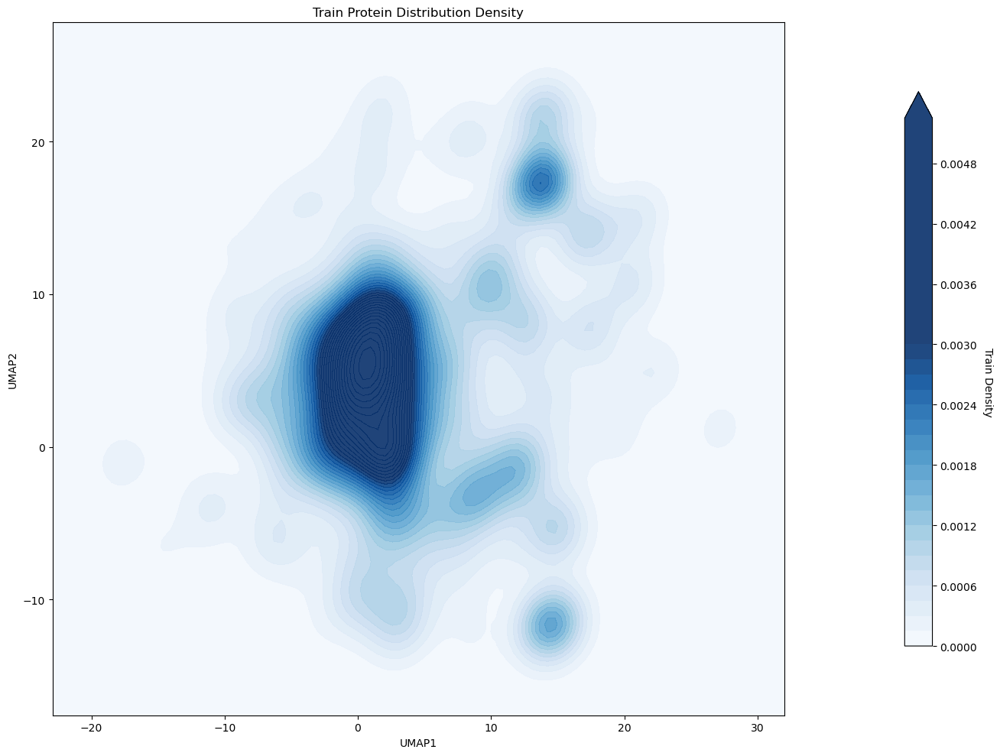

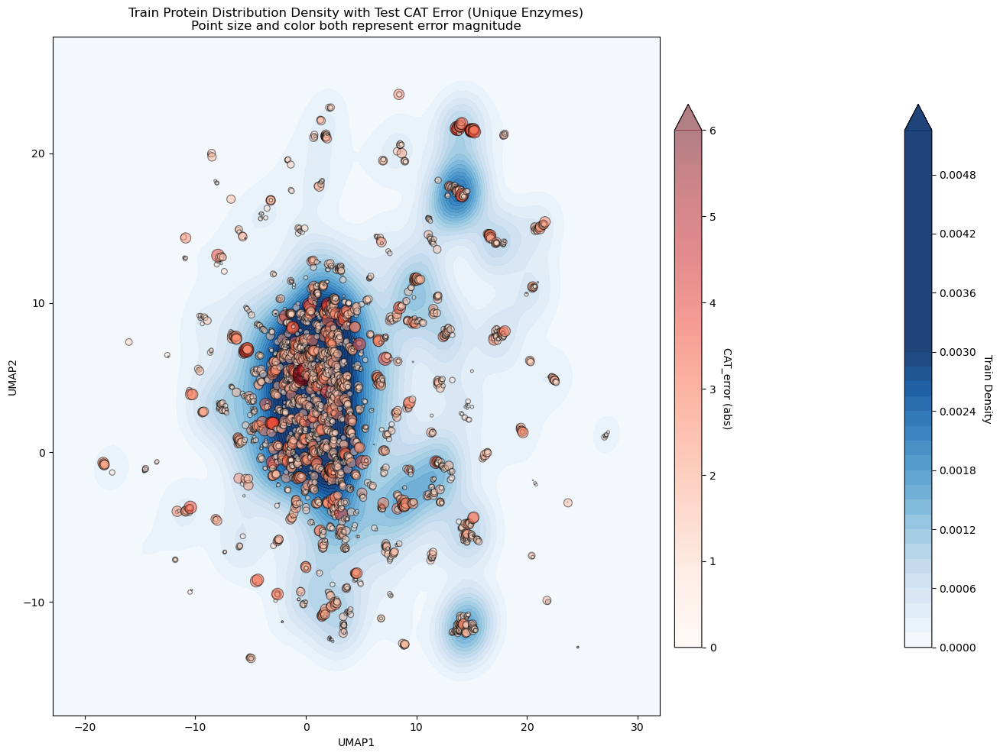

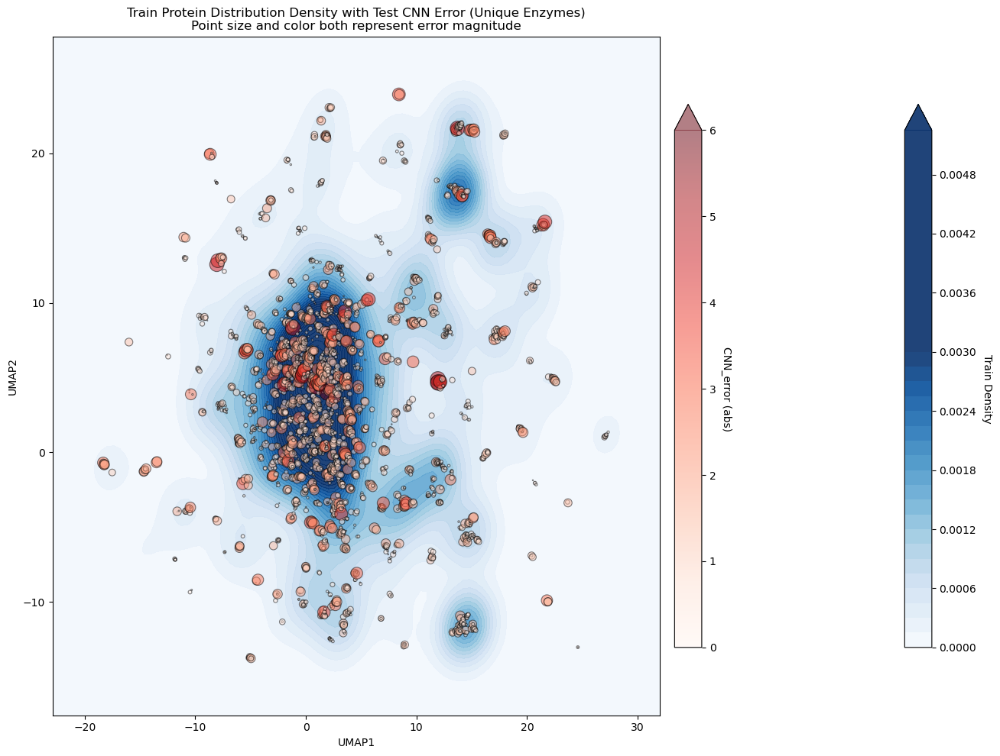

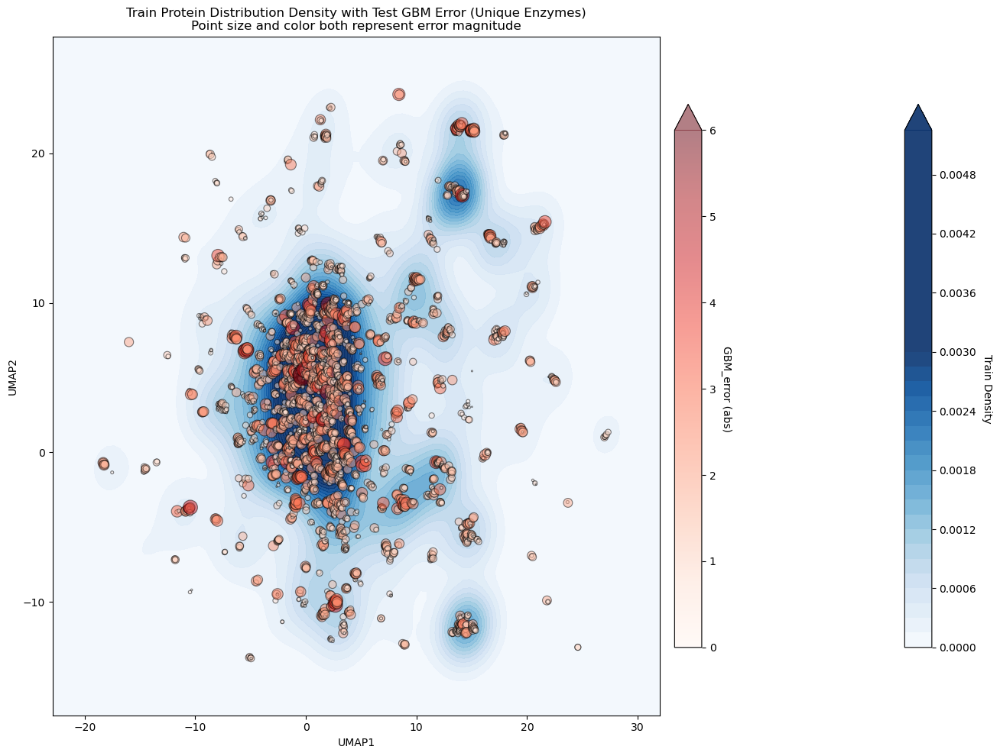

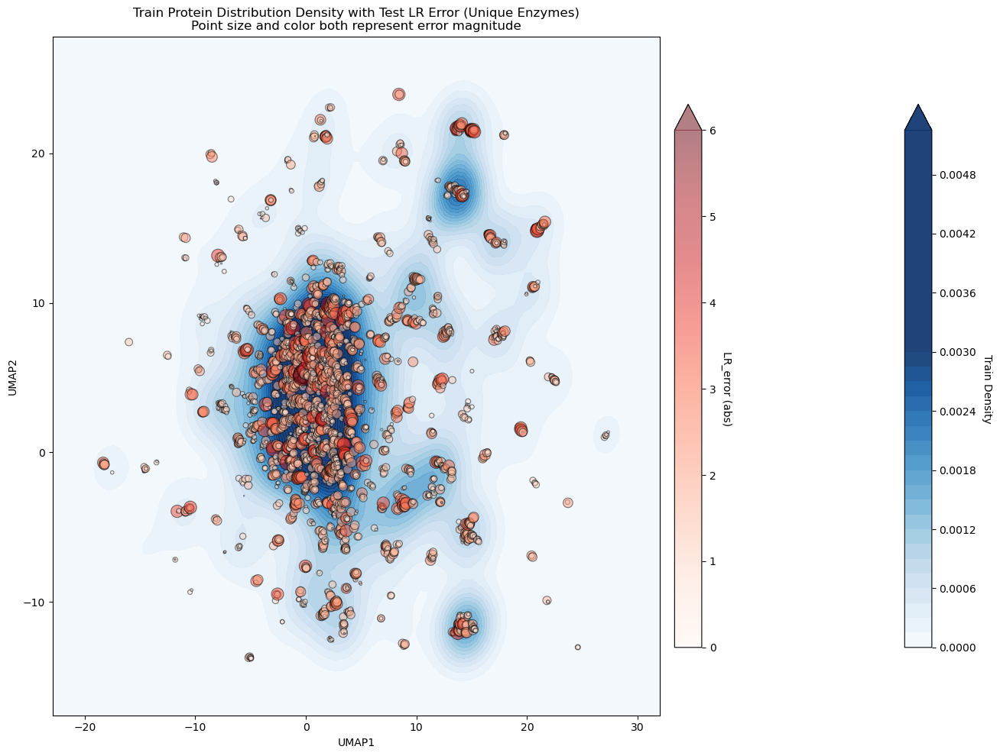

...

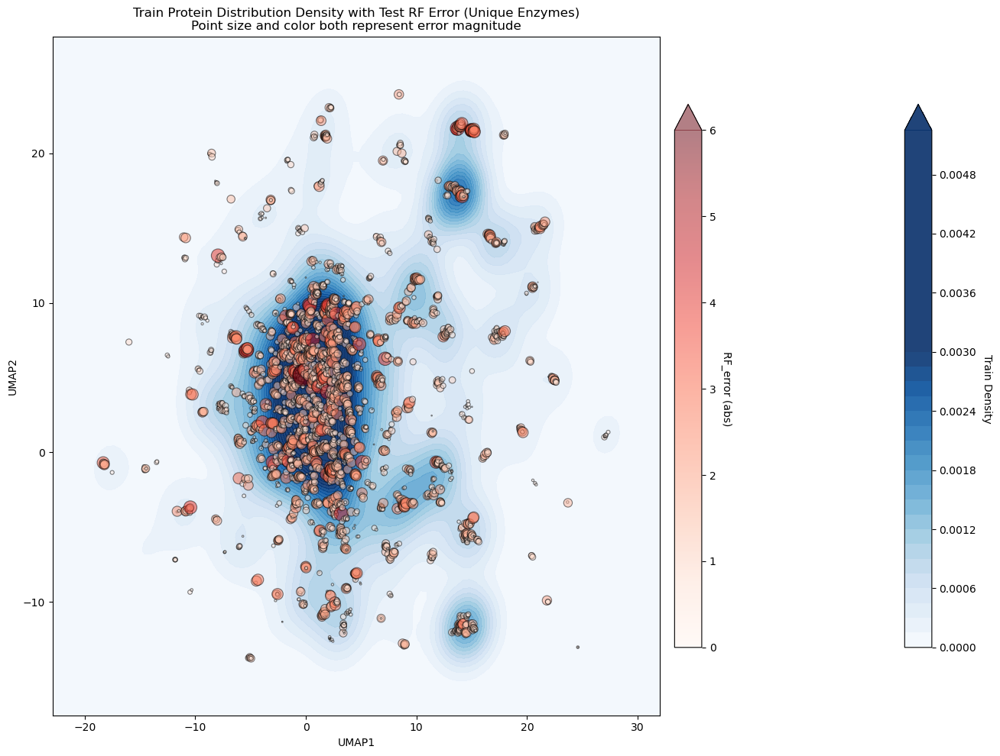

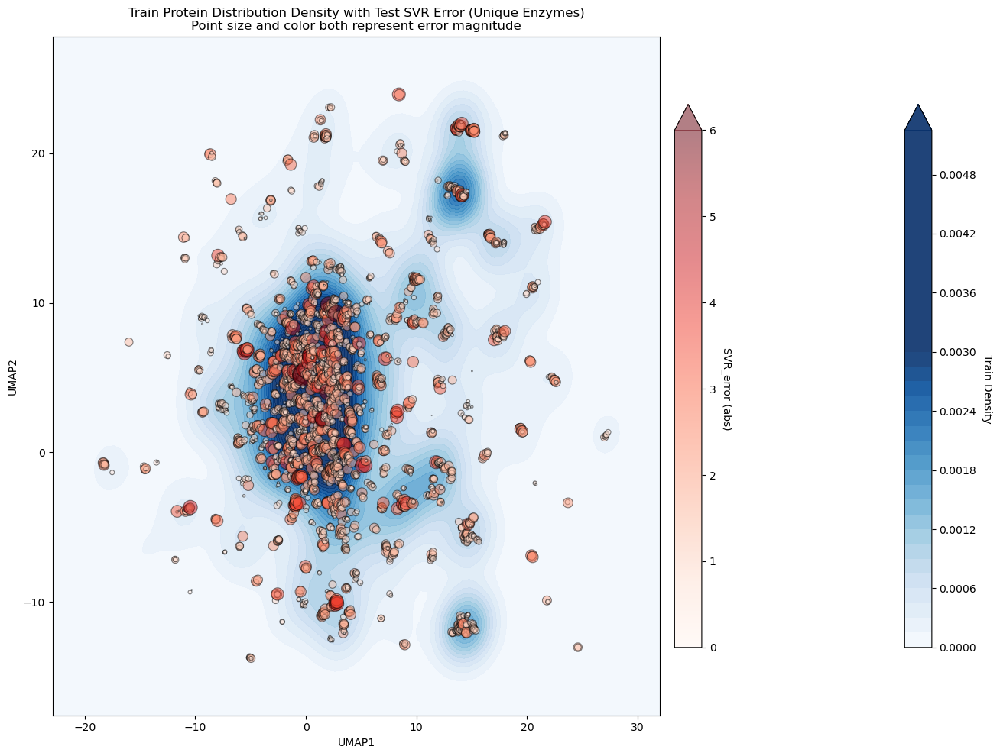

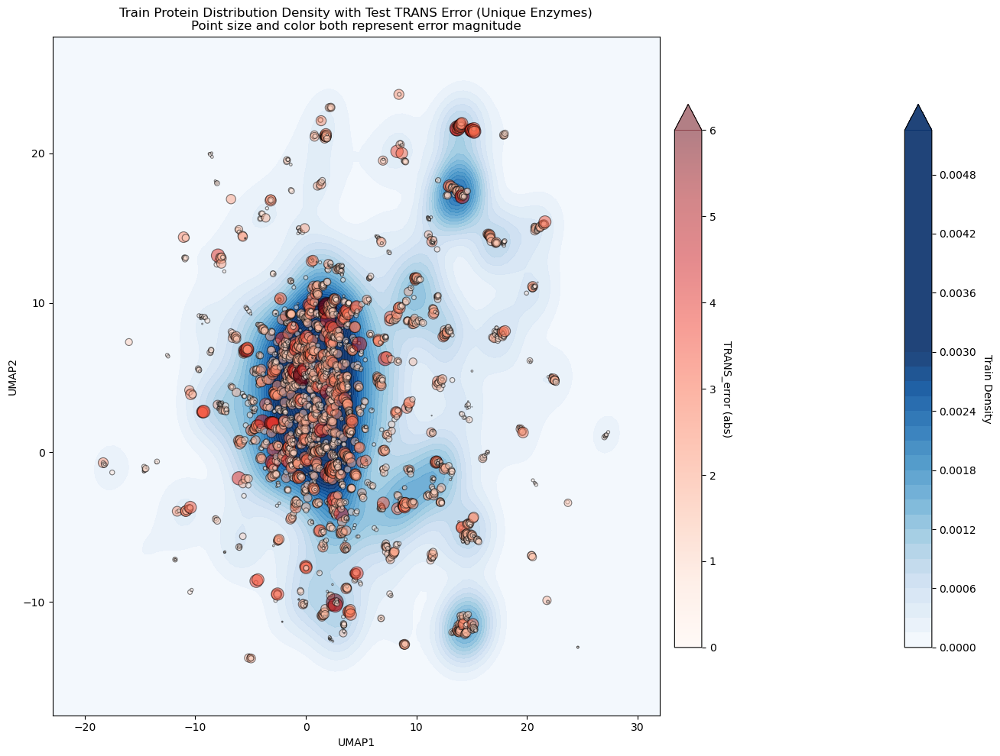

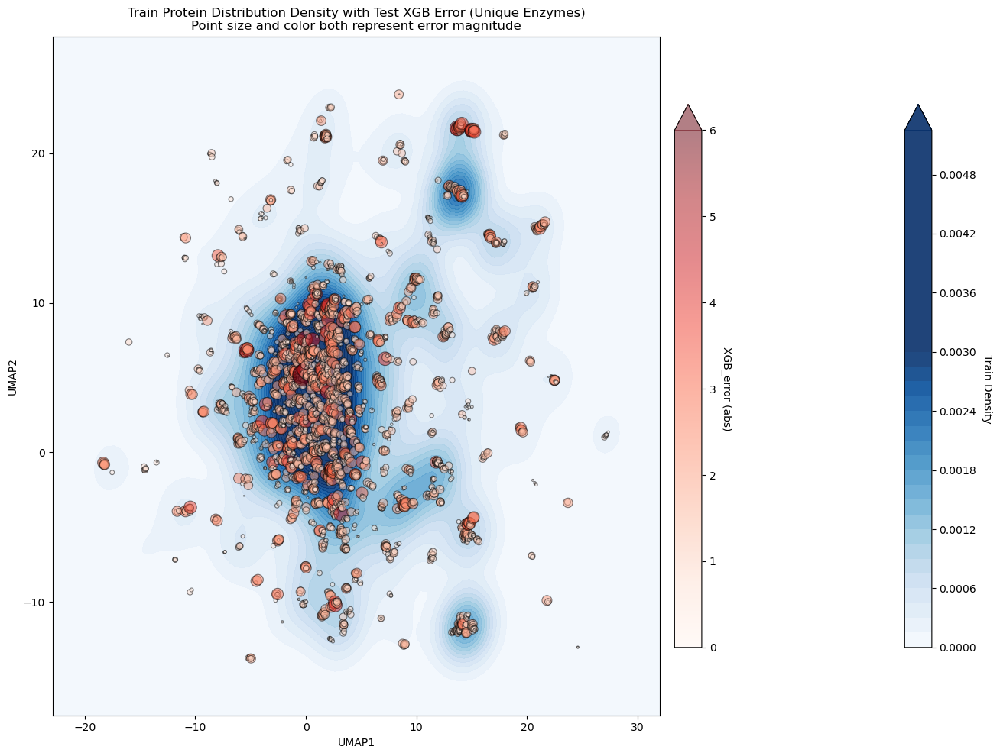

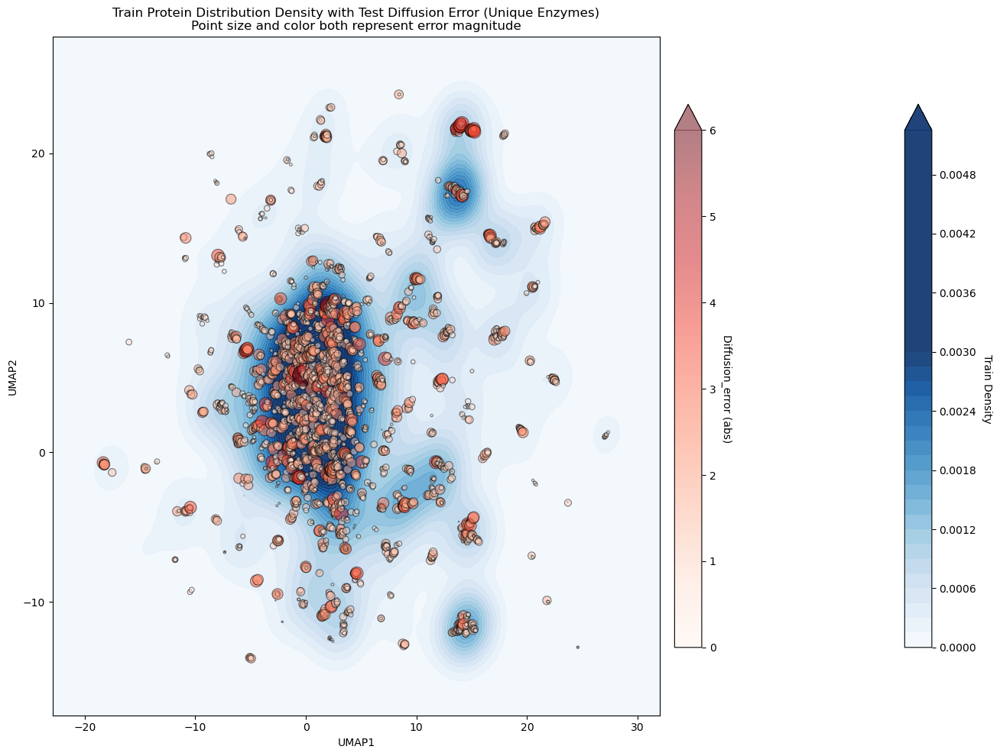

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get UMAP features for training set (protein features)
umap_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "UMAP_feature_protein"]])

# Create grid (with padding)
x_padding = (umap_train[:, 0].max() - umap_train[:, 0].min()) * 0.1
y_padding = (umap_train[:, 1].max() - umap_train[:, 1].min()) * 0.1

x_min, x_max = umap_train[:, 0].min() - x_padding, umap_train[:, 0].max() + x_padding
y_min, y_max = umap_train[:, 1].min() - y_padding, umap_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(umap_train.T)
density = kde(grid_points).reshape(xx.shape)

fig, ax = plt.subplots(figsize=(14, 10))
contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9, vmax=0.003, extend='max') 
cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
cbar1.set_label('Train Density', rotation=270, labelpad=15)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title(f'Train Protein Distribution Density')
plt.tight_layout()
plt.savefig("./outlier_data/umap_density_protein_plot.png", dpi=600)
plt.savefig("./outlier_data/umap_density_protein_plot.svg")
plt.show()

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])
    
    # Group by protein UMAP coordinates and keep only the maximum error for each unique molecule
    test_filtered['umap_coord'] = test_filtered['UMAP_feature_protein'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('umap_coord')['abs_error'].idxmax()]
    
    # Extract coordinates for plotting (protein features)
    umap1_values_unique = [umap_feat[0] for umap_feat in test_unique["UMAP_feature_protein"]]
    umap2_values_unique = [umap_feat[1] for umap_feat in test_unique["UMAP_feature_protein"]]
    
    # Calculate point sizes based on error (normalize to reasonable range)
    abs_errors = test_unique['abs_error'].values
    min_size = 0
    max_size = 400
    # Normalize errors to size range
    normalized_sizes = min_size + abs_errors/10 * (max_size - min_size)
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap 
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9,vmax=0.003,extend='max')
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot with size and color both representing error
    scatter = ax.scatter(
        umap1_values_unique,
        umap2_values_unique,
        c=abs_errors,  # Color represents error
        s=normalized_sizes,  # Size represents error
        cmap="Reds",
        alpha=0.5,
        edgecolors='black',  # Add black edge for better visibility
        linewidth=0.8,   
        vmin=0,
		vmax=6,  # Set color limits for better visibility     
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02, extend='max')
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_title(f'Train Protein Distribution Density with Test {col} Error (Unique Enzymes)\nPoint size and color both represent error magnitude')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/umap_density_protein_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/umap_density_protein_plot_{col}.svg")
    plt.show()

In [25]:
# t-SNE analysis for metabolite features
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# delete the duplicate rows
X_all = np.vstack(data_with_pred["metabolite_features"].values)
X_test = np.vstack(test_with_pred["metabolite_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"original data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use t-SNE for dimensionality reduction
tsne_reducer = TSNE(
    n_components=2, 
    random_state=42,
    perplexity=30,
    n_iter=1000,
    learning_rate=200
)

# fit and transform all data
X_tsne_all = tsne_reducer.fit_transform(X_all)
X_tsne_test = X_tsne_all[index_info['test_index']]

# save t-SNE results to DataFrame
test_with_pred["TSNE_feature_protein"] = [x.tolist() for x in X_tsne_test]
data_with_pred["TSNE_feature_protein"] = [x.tolist() for x in X_tsne_all]


original data: 17010 points
reduced data: 2706 points


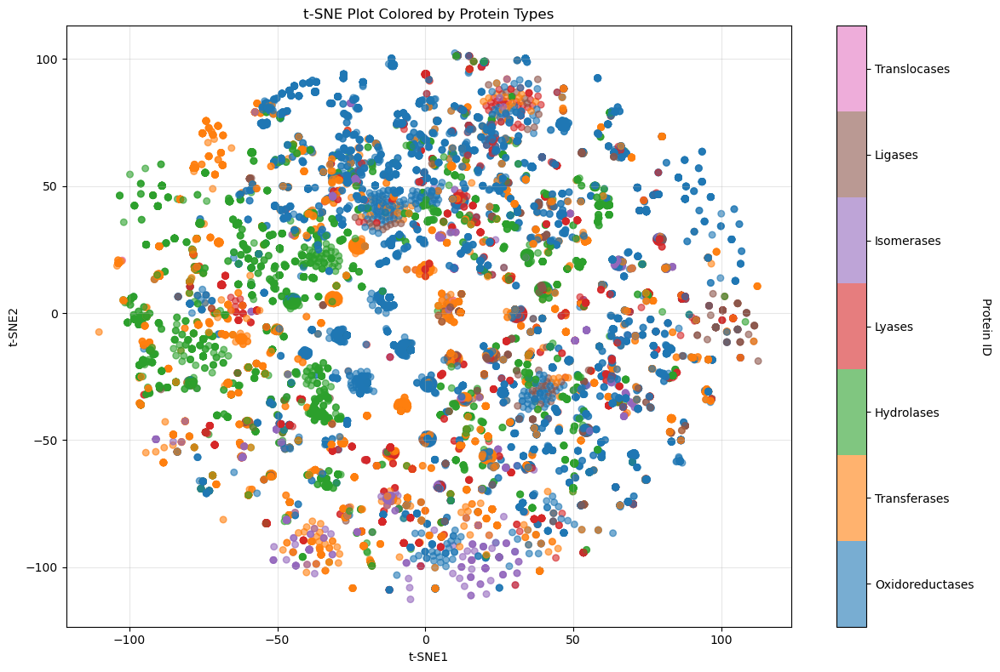

In [26]:
# Plot UMAP with different protein types colored
plt.figure(figsize=(12, 8))

# Get t-SNE coordinates for all data
tsne1_values_all = [tsne_feat[0] for tsne_feat in data_with_pred["TSNE_feature_protein"]]
tsne2_values_all = [tsne_feat[1] for tsne_feat in data_with_pred["TSNE_feature_protein"]]

from matplotlib.colors import ListedColormap
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
cmap_7 = ListedColormap(colors)


# Use protein_id - 1 to map protein_id 1-7 to colormap indices 0-6
scatter = plt.scatter(
    tsne1_values_all,
    tsne2_values_all,
    c=data_with_pred['protein_id'] - 1,
    alpha=0.6,
    s=30,
    cmap=cmap_7,
    vmin=0,
    vmax=7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Protein ID', rotation=270, labelpad=15)

# Set ticks at the center of each color block
cbar.set_ticks([i + 0.5 for i in range(7)])
cbar.set_ticklabels([PROTEIN_TYPES_NAMES[i] for i in range(1, 8)])

plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.title('t-SNE Plot Colored by Protein Types')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/tsne_protein_types.png", dpi=1200)
plt.savefig("./outlier_data/tsne_protein_types.svg")
plt.show()

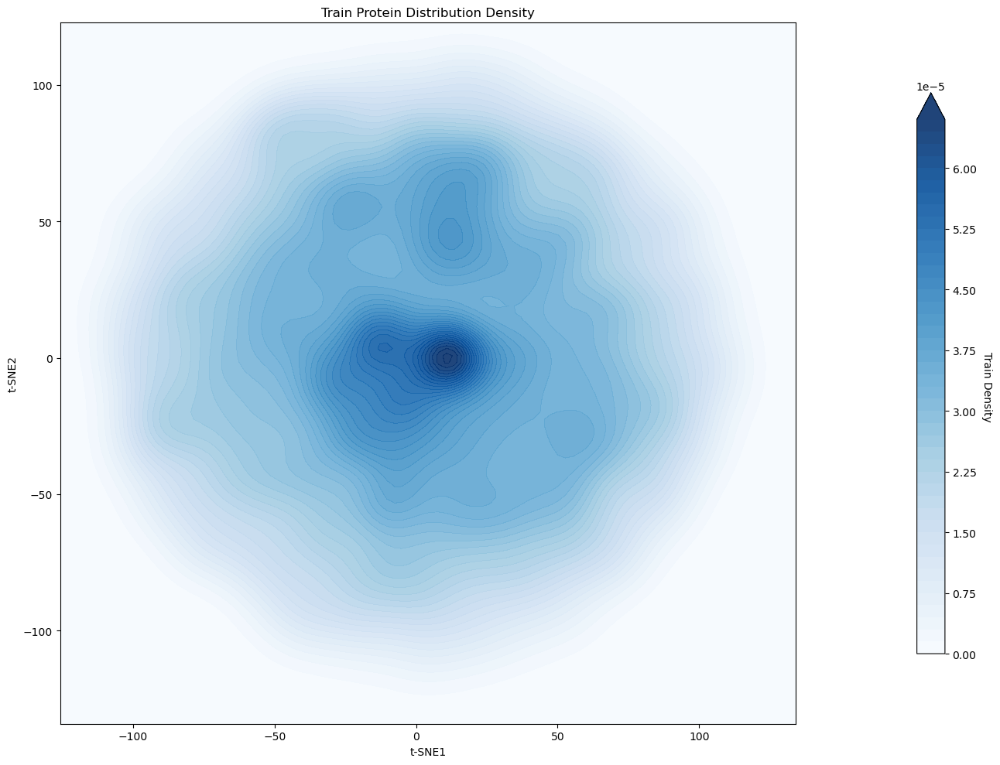

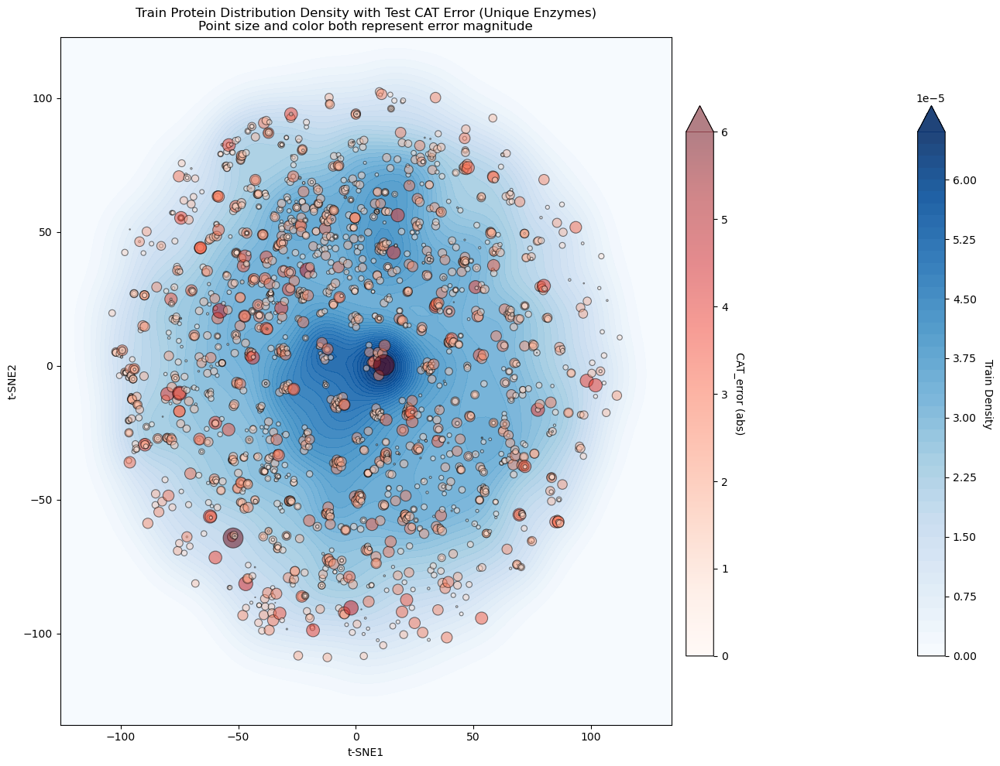

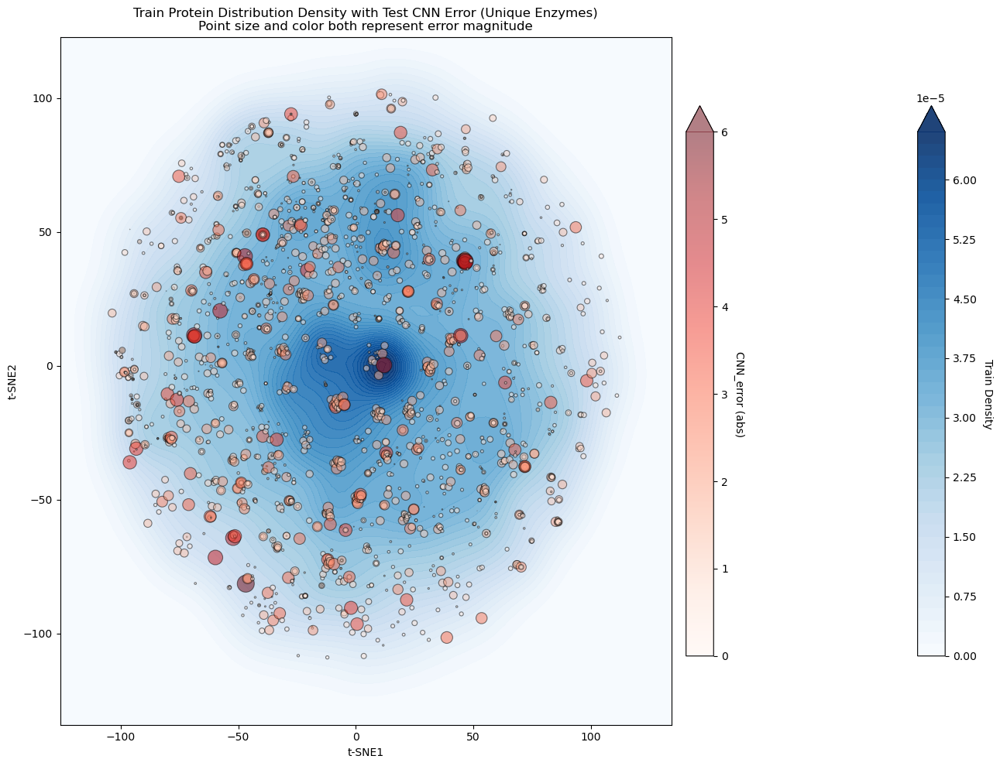

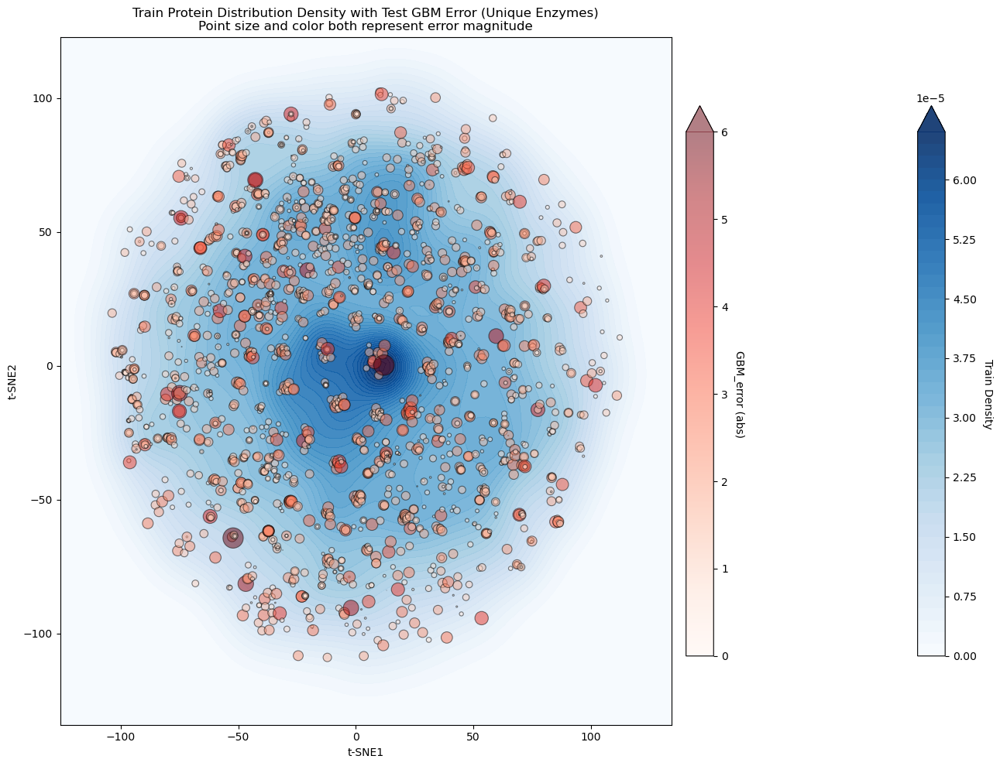

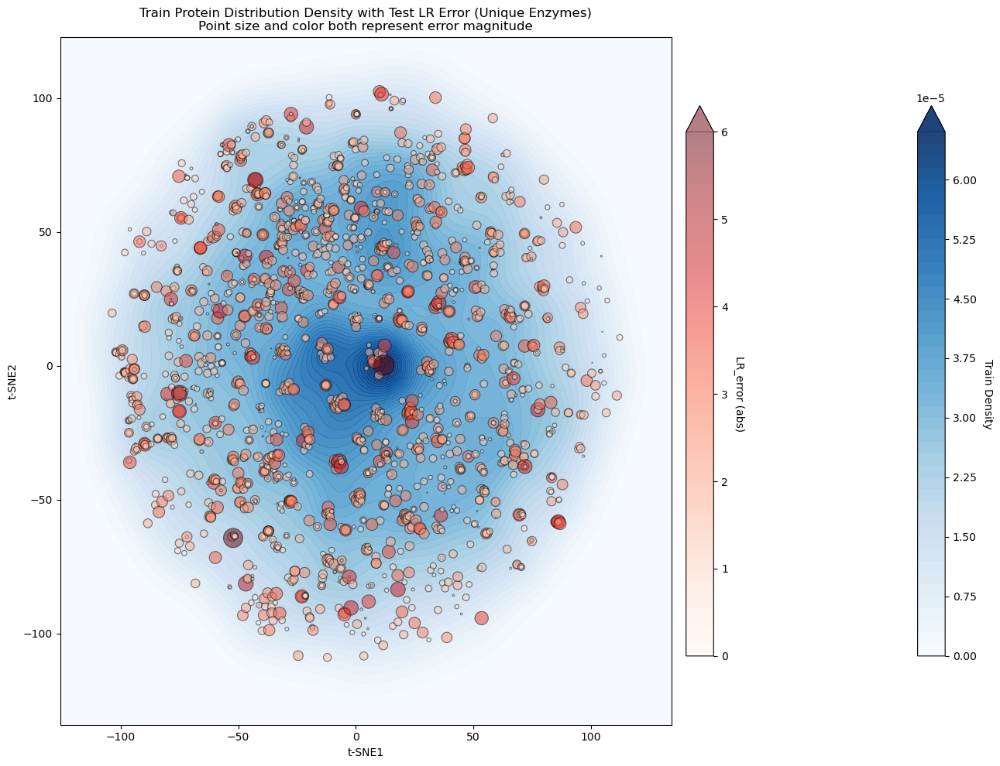

...

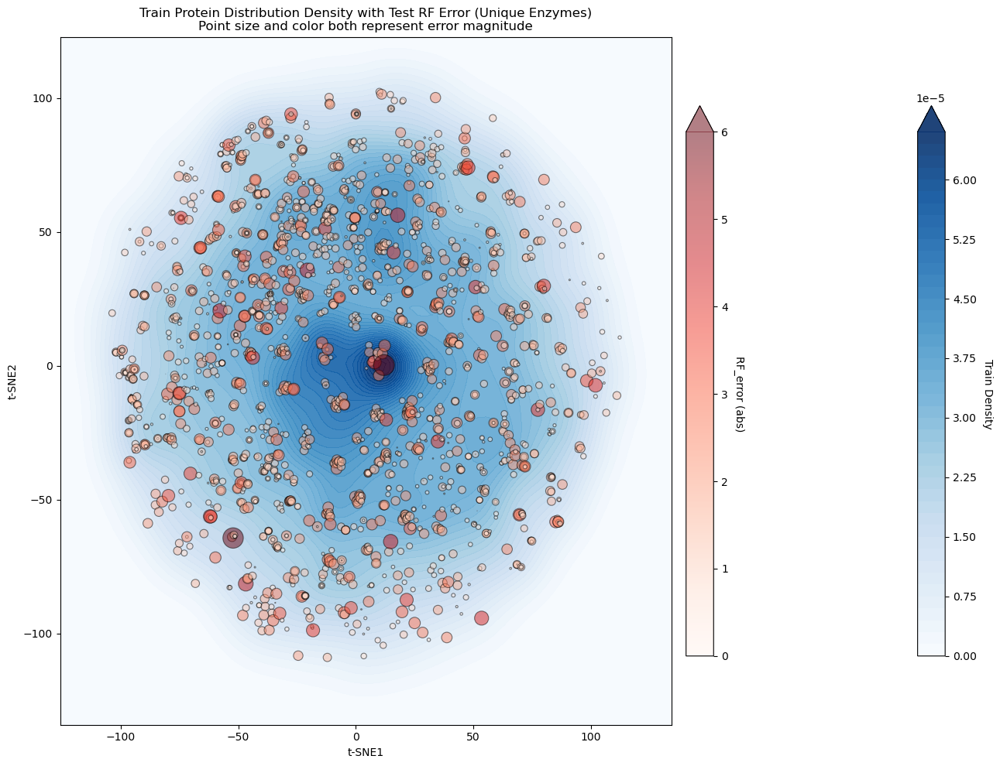

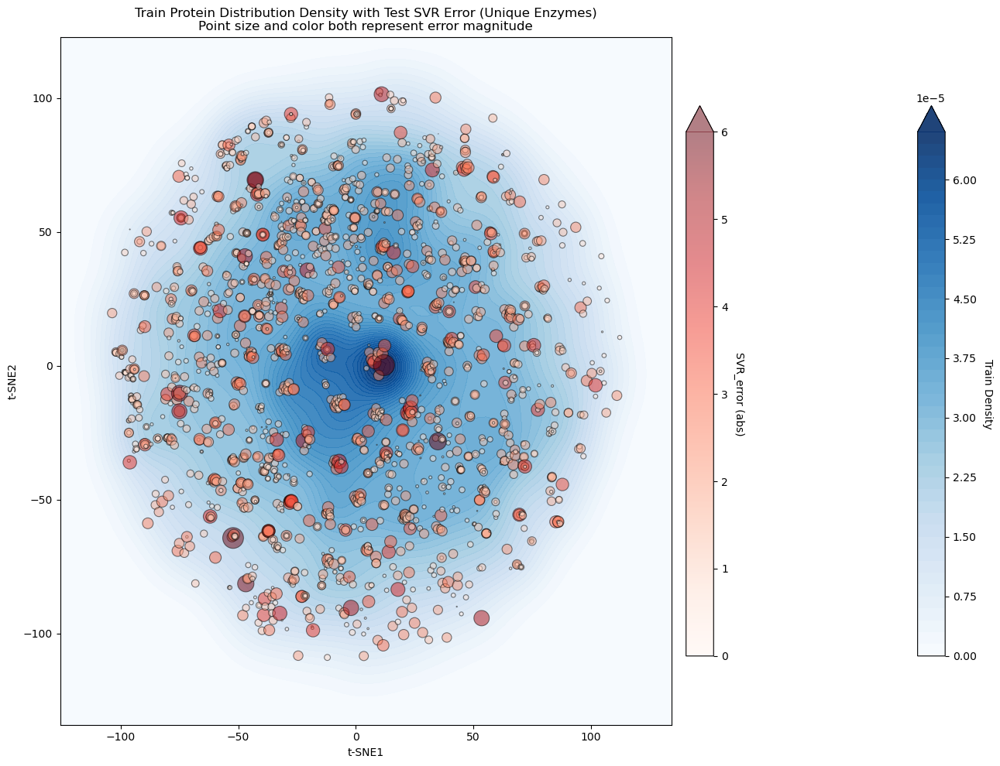

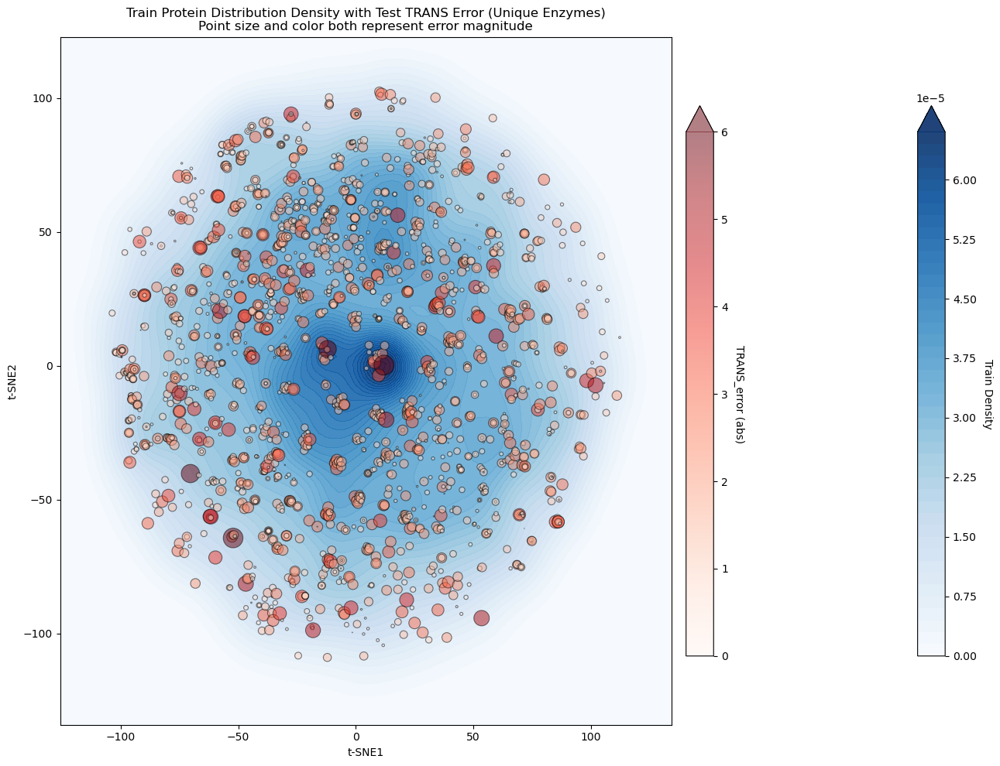

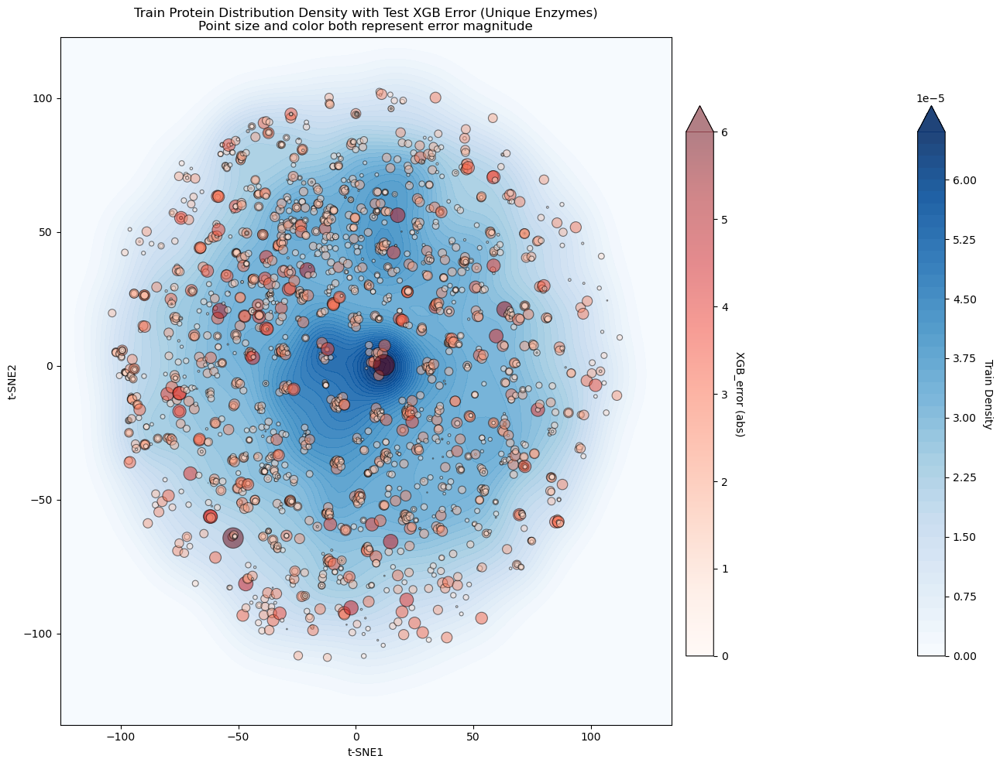

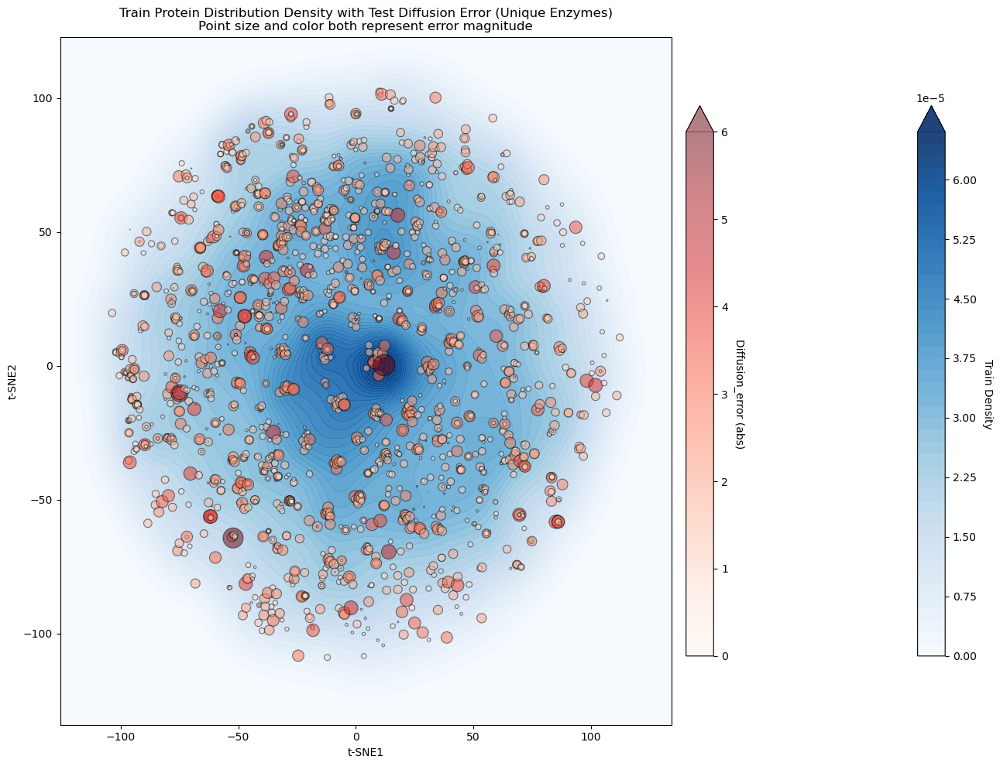

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get t-SNE features for training set (protein features)
tsne_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "TSNE_feature_protein"]])

# Create grid (with padding)
x_padding = (tsne_train[:, 0].max() - tsne_train[:, 0].min()) * 0.1
y_padding = (tsne_train[:, 1].max() - tsne_train[:, 1].min()) * 0.1

x_min, x_max = tsne_train[:, 0].min() - x_padding, tsne_train[:, 0].max() + x_padding
y_min, y_max = tsne_train[:, 1].min() - y_padding, tsne_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(tsne_train.T)
density = kde(grid_points).reshape(xx.shape)

fig, ax = plt.subplots(figsize=(14, 10))
contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9, extend='max') 
cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
cbar1.set_label('Train Density', rotation=270, labelpad=15)
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_title(f'Train Protein Distribution Density')
plt.tight_layout()
plt.savefig("./outlier_data/tsne_density_protein_plot.png", dpi=600)
plt.savefig("./outlier_data/tsne_density_protein_plot.svg")
plt.show()

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])

    # Group by protein t-SNE coordinates and keep only the maximum error for each unique molecule
    test_filtered['tsne_coord'] = test_filtered['TSNE_feature_protein'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('tsne_coord')['abs_error'].idxmax()]

    # Extract coordinates for plotting (protein features)
    tsne1_values_unique = [tsne_feat[0] for tsne_feat in test_unique["TSNE_feature_protein"]]
    tsne2_values_unique = [tsne_feat[1] for tsne_feat in test_unique["TSNE_feature_protein"]]

    # Calculate point sizes based on error (normalize to reasonable range)
    abs_errors = test_unique['abs_error'].values
    min_size = 0
    max_size = 400
    # Normalize errors to size range
    normalized_sizes = min_size + abs_errors/10 * (max_size - min_size)
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap 
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9,extend='max')
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot with size and color both representing error
    scatter = ax.scatter(
        tsne1_values_unique,
        tsne2_values_unique,
        c=abs_errors,  # Color represents error
        s=normalized_sizes,  # Size represents error
        cmap="Reds",
        alpha=0.5,
        edgecolors='black',  # Add black edge for better visibility
        linewidth=0.8,   
        vmin=0,
		vmax=6,  # Set color limits for better visibility     
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02, extend='max')
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('t-SNE1')
    ax.set_ylabel('t-SNE2')
    ax.set_title(f'Train Protein Distribution Density with Test {col} Error (Unique Enzymes)\nPoint size and color both represent error magnitude')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/tsne_density_protein_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/tsne_density_protein_plot_{col}.svg")
    plt.show()